## Road networks and H3 division for multiple cities

In [3]:
import pygris
import osmnx as ox
import pandas as pd
from shapely.geometry import Point, Polygon
import numpy as np
from tqdm import tqdm
import geopandas as gpd
from collections import defaultdict
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
import networkx as nx
from utils import construct_block_graph, evaluate_zoning, haversine_distance
import h3
import json

### Define common functions

In [4]:
def create_h3_hexagons(boundary, road_graph, city_name, resolution=7, plot=True):
    """
    Create H3 hexagons for a city boundary and map them to road network nodes.
    
    Parameters:
    -----------
    boundary : shapely.geometry
        City boundary geometry
    road_graph : networkx.MultiDiGraph
        Road network graph from OSMnx
    city_name : str
        Name of the city for labeling
    resolution : int, default=7
        H3 resolution level (7, 8, or 9)
    plot : bool, default=True
        Whether to plot the hexagonal grid
    
    Returns:
    --------
    hex_gdf : geopandas.GeoDataFrame
        GeoDataFrame containing hexagons with center nodes
    """
    # Generate H3 hexagons
    hexagons = h3.geo_to_cells(boundary, resolution)
    hex_polygons = [Polygon(h3.cell_to_boundary(hexagon)) for hexagon in hexagons]
    
    # Create GeoDataFrame
    hex_gdf = gpd.GeoDataFrame(geometry=hex_polygons)
    hex_gdf['id'] = hexagons
    hex_gdf.set_index('id', inplace=True)
    
    # Calculate centroids and find nearest road network nodes
    for hexid, row in hex_gdf.iterrows():
        # Calculate the centroid of each hexagon
        hex_gdf.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
        hex_gdf.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
        
        # Get the nearest node in the road network to the centroid
        center_node = int(ox.distance.nearest_nodes(
            road_graph, 
            float(row.geometry.centroid.y), 
            float(row.geometry.centroid.x)
        ))
        hex_gdf.at[hexid, 'center_node'] = center_node
        hex_gdf.at[hexid, 'center_node_lat'] = road_graph.nodes[center_node]['y']
        hex_gdf.at[hexid, 'center_node_lon'] = road_graph.nodes[center_node]['x']
    
    # Reverse lat/lon order for proper visualization
    hex_gdf.geometry = hex_gdf.geometry.map(
        lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords])
    )
    
    print(f"{city_name} - Number of H3 hexagons (Resolution {resolution}): {len(hex_gdf)}")
    
    # Plot if requested
    if plot:
        hex_gdf.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
        plt.title(f'H3 Hexagonal Grid for {city_name} (Resolution {resolution})', fontsize=14)
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.tight_layout()
        plt.show()
    
    return hex_gdf

### Chicago, Illinois, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Chicago.

In [5]:
# # Option 1: Load the downloaded graph from data/
# G_chicago = ox.load_graphml('data/chicago_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Chicago, Illinois, USA"
G_chicago = ox.graph_from_place(city_name, network_type='drive')

# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_chicago = ox.add_edge_travel_times(ox.add_edge_speeds(G_chicago))
ox.save_graphml(G_chicago, filepath='data/chicago_graph.graphml')

# Print network statistics
print(f"Number of nodes: {len(G_chicago.nodes)}")
print(f"Number of edges: {len(G_chicago.edges)}")

Number of nodes: 29462
Number of edges: 77321


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

#### Load Road Network

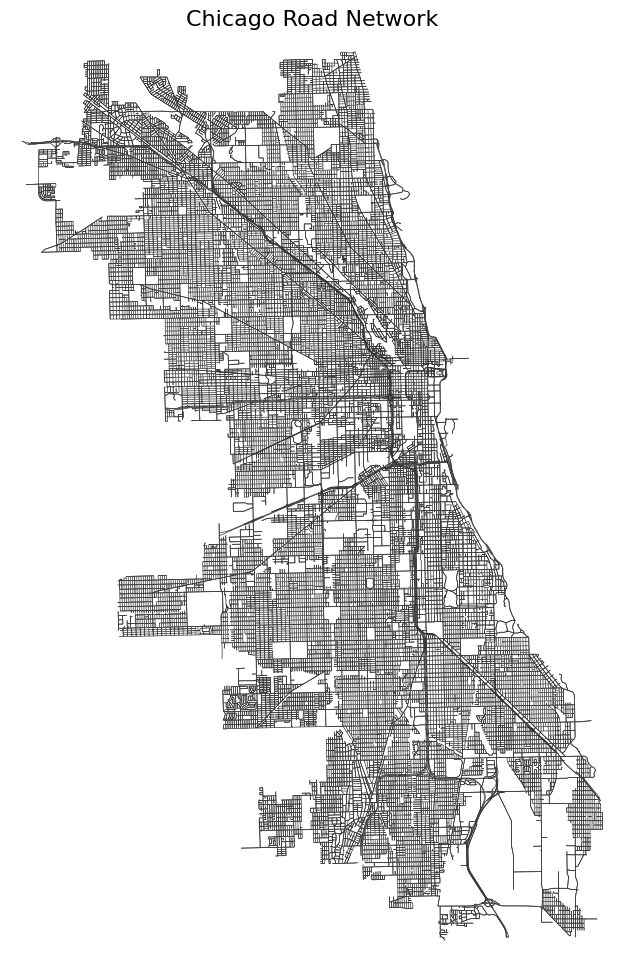

In [22]:
# Visualize the Chicago road network
fig, ax = ox.plot_graph(G_chicago, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Chicago Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [23]:
# Get city boundary
boundary_chicago = ox.geocode_to_gdf("Chicago, Illinois, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

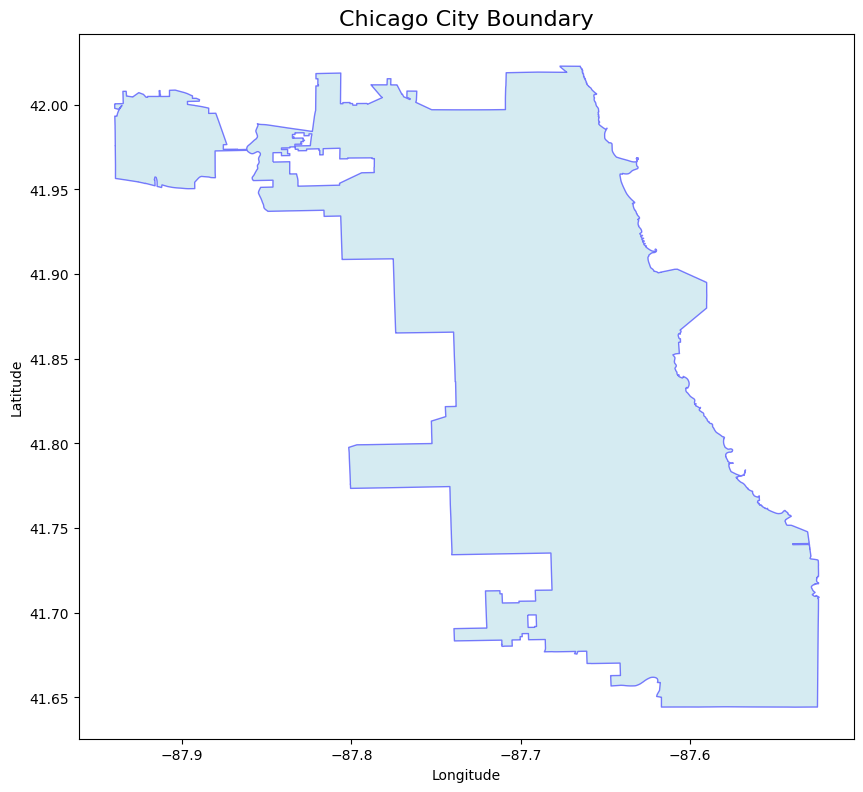

In [24]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_chicago]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Chicago City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
This cell creates H3 hexagons at resolution 7 covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [25]:
# H3 hexagon mapping for Chicago
resolution = 7

hexagons_chicago = h3.geo_to_cells(boundary_chicago, resolution)
hex_polygons_chicago = []
for hexagon in hexagons_chicago:
    hex_polygons_chicago.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_chicago = gpd.GeoDataFrame(geometry=hex_polygons_chicago)

hex_gdf_chicago['id'] = hexagons_chicago
hex_gdf_chicago.set_index('id', inplace=True)
for hexid, row in hex_gdf_chicago.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_chicago.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_chicago.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_chicago, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_chicago.at[hexid, 'center_node'] = center_node
    hex_gdf_chicago.at[hexid, 'center_node_lat'] = G_chicago.nodes[center_node]['y']
    hex_gdf_chicago.at[hexid, 'center_node_lon'] = G_chicago.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_chicago.geometry = hex_gdf_chicago.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Chicago - Number of H3 hexagons: {len(hex_gdf_chicago)}")

Chicago - Number of H3 hexagons: 117


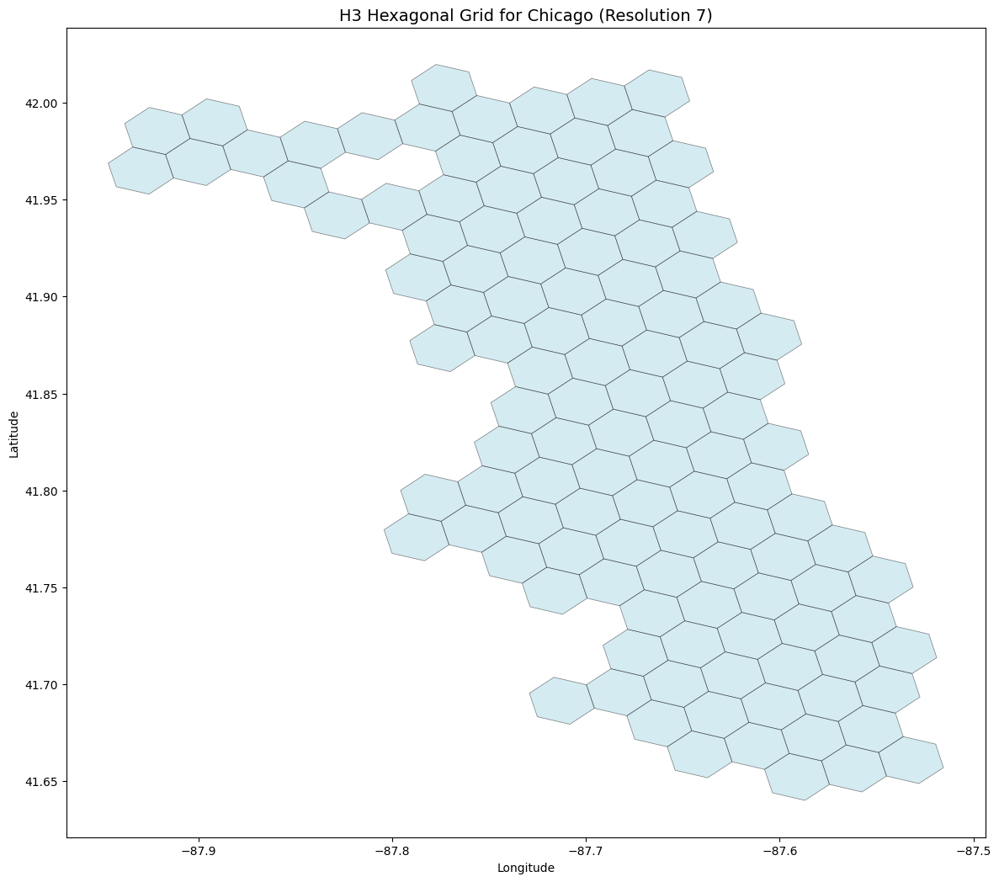

In [26]:
hex_gdf_chicago.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Chicago (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

This cell visualizes the H3 hexagonal grid at resolution 8.

In [27]:
# H3 hexagon mapping for Chicago (Resolution 8)
resolution = 8

hexagons_chicago_8 = h3.geo_to_cells(boundary_chicago, resolution)
hex_polygons_chicago_8 = []
for hexagon in hexagons_chicago_8:
    hex_polygons_chicago_8.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_chicago_8 = gpd.GeoDataFrame(geometry=hex_polygons_chicago_8)

hex_gdf_chicago_8['id'] = hexagons_chicago_8
hex_gdf_chicago_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_chicago_8.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_chicago_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_chicago_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_chicago, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_chicago_8.at[hexid, 'center_node'] = center_node
    hex_gdf_chicago_8.at[hexid, 'center_node_lat'] = G_chicago.nodes[center_node]['y']
    hex_gdf_chicago_8.at[hexid, 'center_node_lon'] = G_chicago.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization
hex_gdf_chicago_8.geometry = hex_gdf_chicago_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Chicago - Number of H3 hexagons (Resolution 8): {len(hex_gdf_chicago_8)}")

Chicago - Number of H3 hexagons (Resolution 8): 819


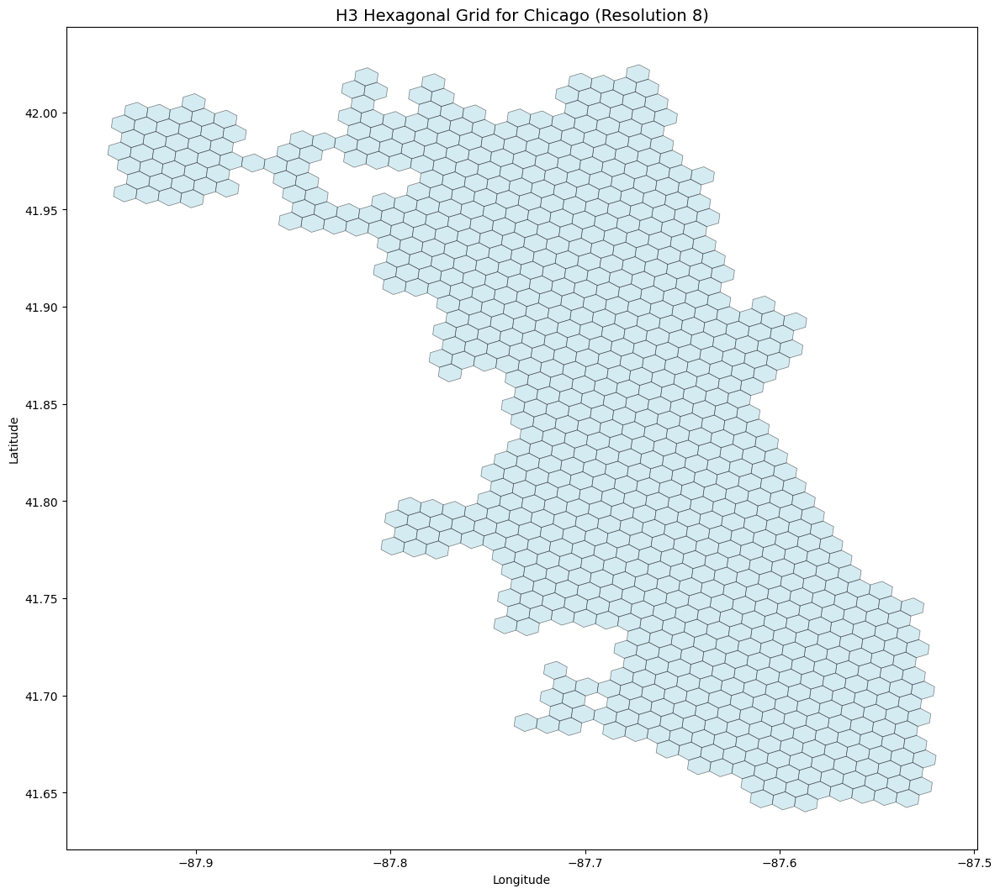

In [28]:
hex_gdf_chicago_8.plot(figsize=(12, 12), facecolor='lightblue', 
                       edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Chicago (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Chicago (Resolution 9)
resolution = 9

hexagons_chicago_9 = h3.geo_to_cells(boundary_chicago, resolution)
hex_polygons_chicago_9 = []
for hexagon in hexagons_chicago_9:
    hex_polygons_chicago_9.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_chicago_9 = gpd.GeoDataFrame(geometry=hex_polygons_chicago_9)

hex_gdf_chicago_9['id'] = hexagons_chicago_9
hex_gdf_chicago_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_chicago_9.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_chicago_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_chicago_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_chicago, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_chicago_9.at[hexid, 'center_node'] = center_node
    hex_gdf_chicago_9.at[hexid, 'center_node_lat'] = G_chicago.nodes[center_node]['y']
    hex_gdf_chicago_9.at[hexid, 'center_node_lon'] = G_chicago.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization
hex_gdf_chicago_9.geometry = hex_gdf_chicago_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Chicago - Number of H3 hexagons (Resolution 9): {len(hex_gdf_chicago_9)}")

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x78cf60acb190>>
Traceback (most recent call last):
  File "/home/hins/miniconda3/envs/mzones/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


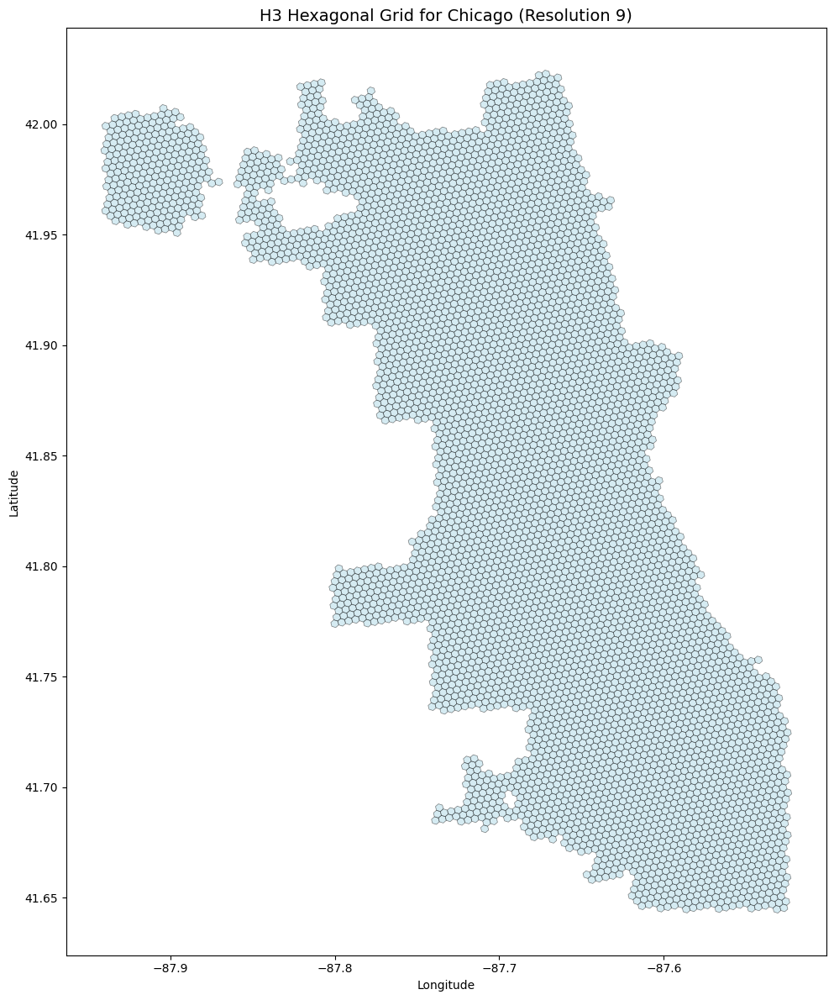

In [ ]:
hex_gdf_chicago_9.plot(figsize=(12, 12), facecolor='lightblue', 
                       edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Chicago (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_chicago.set_crs(epsg=4326, inplace=True)
hex_gdf_chicago = hex_gdf_chicago.to_crs(epsg=4269)
hex_gdf_chicago.to_file('data/hex_chicago_res7.geojson', driver='GeoJSON')

hex_gdf_chicago_8.set_crs(epsg=4326, inplace=True)
hex_gdf_chicago_8 = hex_gdf_chicago_8.to_crs(epsg=4269)
hex_gdf_chicago_8.to_file('data/hex_chicago_res8.geojson', driver='GeoJSON')

hex_gdf_chicago_9.set_crs(epsg=4326, inplace=True)
hex_gdf_chicago_9 = hex_gdf_chicago_9.to_crs(epsg=4269)
hex_gdf_chicago_9.to_file('data/hex_chicago_res9.geojson', driver='GeoJSON')

### Chattanooga, Tennessee, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Chattanooga.

In [ ]:
# # Option 1: Load the downloaded graph from data/
# G_chatt = ox.load_graphml('data/chatt_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Chattanooga, Tennessee, USA"
G_chatt = ox.graph_from_place(city_name, network_type='drive')

# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_chatt = ox.add_edge_travel_times(ox.add_edge_speeds(G_chatt))
ox.save_graphml(G_chatt, filepath='data/chatt_graph.graphml')

# Print network statistics
print(f"Chattanooga - Number of nodes: {len(G_chatt.nodes)}")
print(f"Chattanooga - Number of edges: {len(G_chatt.edges)}")

Chattanooga - Number of nodes: 9486
Chattanooga - Number of edges: 24358


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

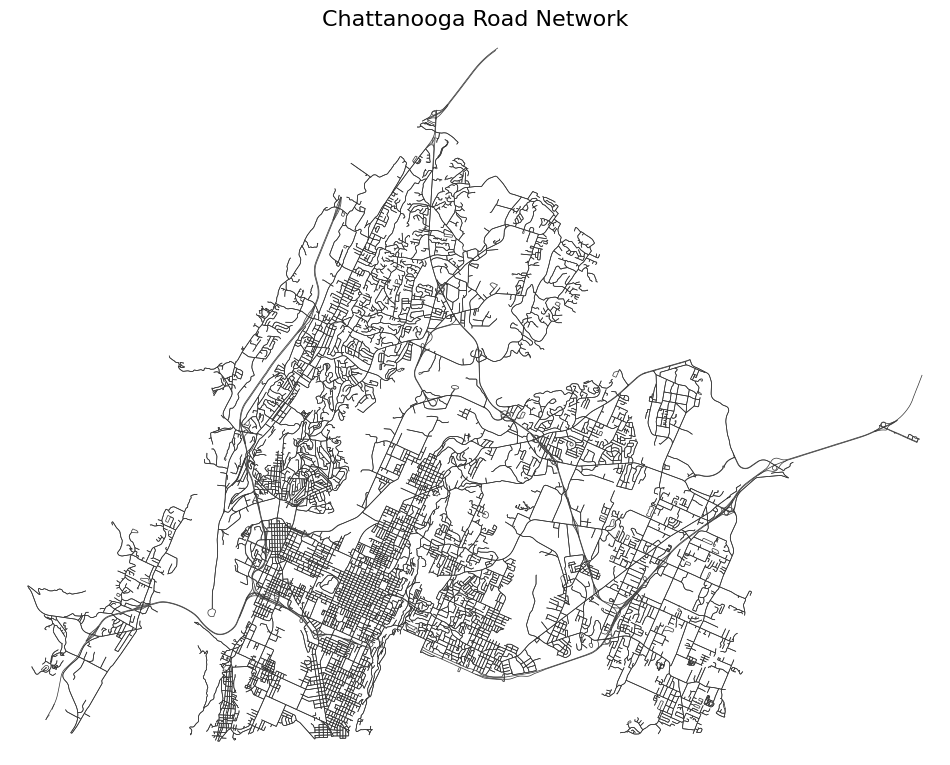

In [ ]:
# Visualize the Chattanooga road network
fig, ax = ox.plot_graph(G_chatt, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Chattanooga Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [ ]:
# Get city boundary
boundary_chatt = ox.geocode_to_gdf("Chattanooga, Tennessee, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

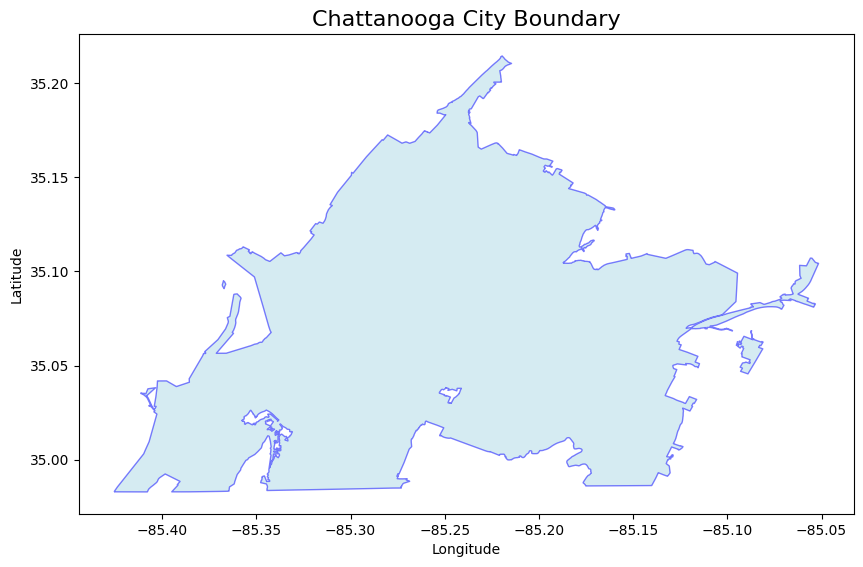

In [ ]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_chatt]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Chattanooga City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
These cells creates H3 hexagons at three resolutions (7, 8, 9) covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [ ]:
# H3 hexagon mapping for Chattanooga
resolution = 7

hexagons_chatt = h3.geo_to_cells(boundary_chatt, resolution)
hex_polygons_chatt = []
for hexagon in hexagons_chatt:
    hex_polygons_chatt.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_chatt = gpd.GeoDataFrame(geometry=hex_polygons_chatt)

hex_gdf_chatt['id'] = hexagons_chatt
hex_gdf_chatt.set_index('id', inplace=True)
for hexid, row in hex_gdf_chatt.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_chatt.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_chatt.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_chatt, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_chatt.at[hexid, 'center_node'] = center_node
    hex_gdf_chatt.at[hexid, 'center_node_lat'] = G_chatt.nodes[center_node]['y']
    hex_gdf_chatt.at[hexid, 'center_node_lon'] = G_chatt.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_chatt.geometry = hex_gdf_chatt.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Chattanooga - Number of H3 hexagons: {len(hex_gdf_chatt)}")

Chattanooga - Number of H3 hexagons: 80


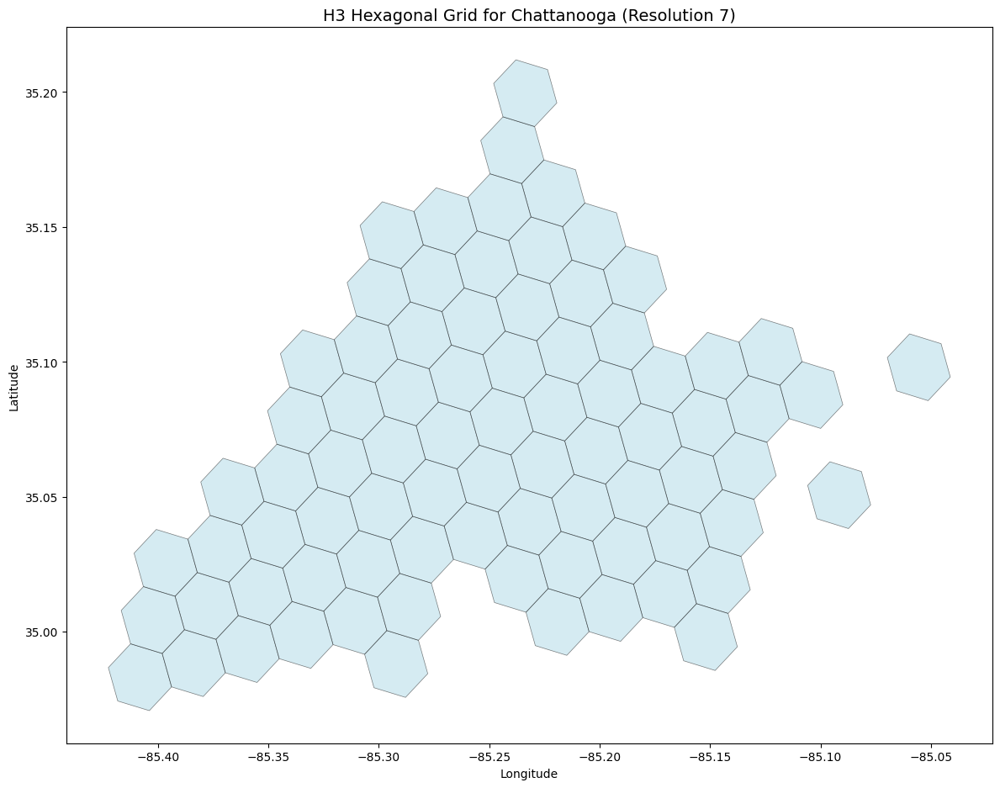

In [ ]:
hex_gdf_chatt.plot(figsize=(12, 12), facecolor='lightblue', 
                   edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Chattanooga (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Chattanooga (Resolution 8)
resolution = 8

hexagons_chatt_8 = h3.geo_to_cells(boundary_chatt, resolution)
hex_polygons_chatt_8 = []
for hexagon in hexagons_chatt_8:
    hex_polygons_chatt_8.append(Polygon(h3.cell_to_boundary(hexagon)))

hex_gdf_chatt_8 = gpd.GeoDataFrame(geometry=hex_polygons_chatt_8)
hex_gdf_chatt_8['id'] = hexagons_chatt_8
hex_gdf_chatt_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_chatt_8.iterrows():
    hex_gdf_chatt_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_chatt_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_chatt, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_chatt_8.at[hexid, 'center_node'] = center_node
    hex_gdf_chatt_8.at[hexid, 'center_node_lat'] = G_chatt.nodes[center_node]['y']
    hex_gdf_chatt_8.at[hexid, 'center_node_lon'] = G_chatt.nodes[center_node]['x']

hex_gdf_chatt_8.geometry = hex_gdf_chatt_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Chattanooga - Number of H3 hexagons (Resolution 8): {len(hex_gdf_chatt_8)}")

Chattanooga - Number of H3 hexagons (Resolution 8): 551


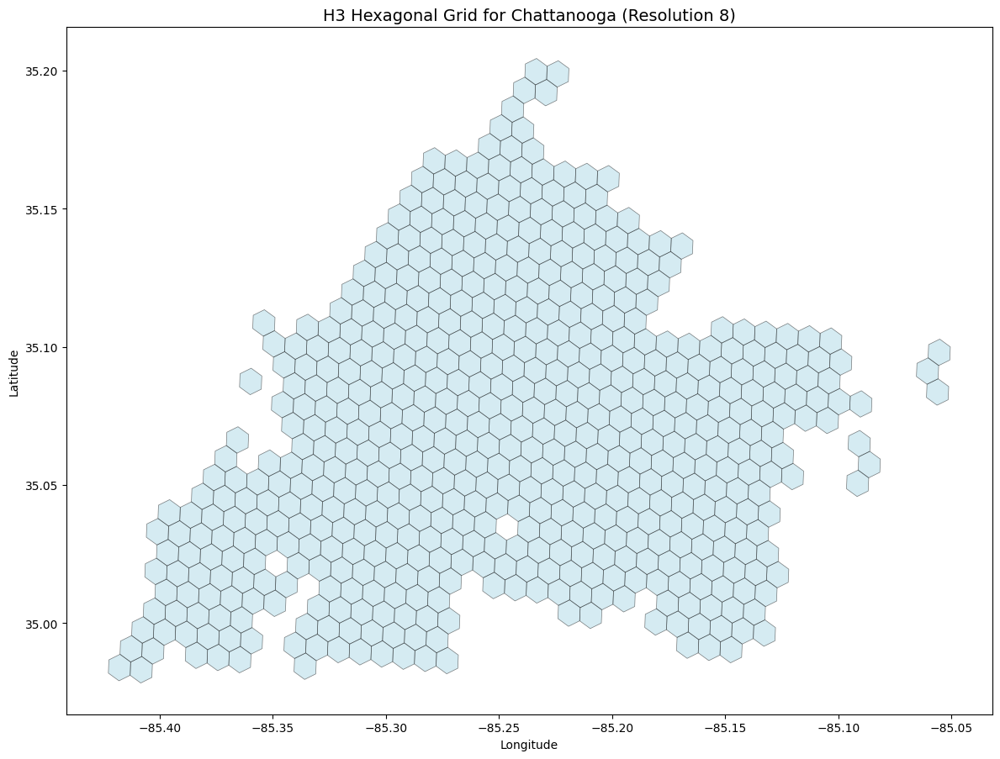

In [ ]:
hex_gdf_chatt_8.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Chattanooga (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Chattanooga (Resolution 9)
resolution = 9

hexagons_chatt_9 = h3.geo_to_cells(boundary_chatt, resolution)
hex_polygons_chatt_9 = []
for hexagon in hexagons_chatt_9:
    hex_polygons_chatt_9.append(Polygon(h3.cell_to_boundary(hexagon)))

hex_gdf_chatt_9 = gpd.GeoDataFrame(geometry=hex_polygons_chatt_9)
hex_gdf_chatt_9['id'] = hexagons_chatt_9
hex_gdf_chatt_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_chatt_9.iterrows():
    hex_gdf_chatt_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_chatt_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_chatt, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_chatt_9.at[hexid, 'center_node'] = center_node
    hex_gdf_chatt_9.at[hexid, 'center_node_lat'] = G_chatt.nodes[center_node]['y']
    hex_gdf_chatt_9.at[hexid, 'center_node_lon'] = G_chatt.nodes[center_node]['x']

hex_gdf_chatt_9.geometry = hex_gdf_chatt_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Chattanooga - Number of H3 hexagons (Resolution 9): {len(hex_gdf_chatt_9)}")

Chattanooga - Number of H3 hexagons (Resolution 9): 3874


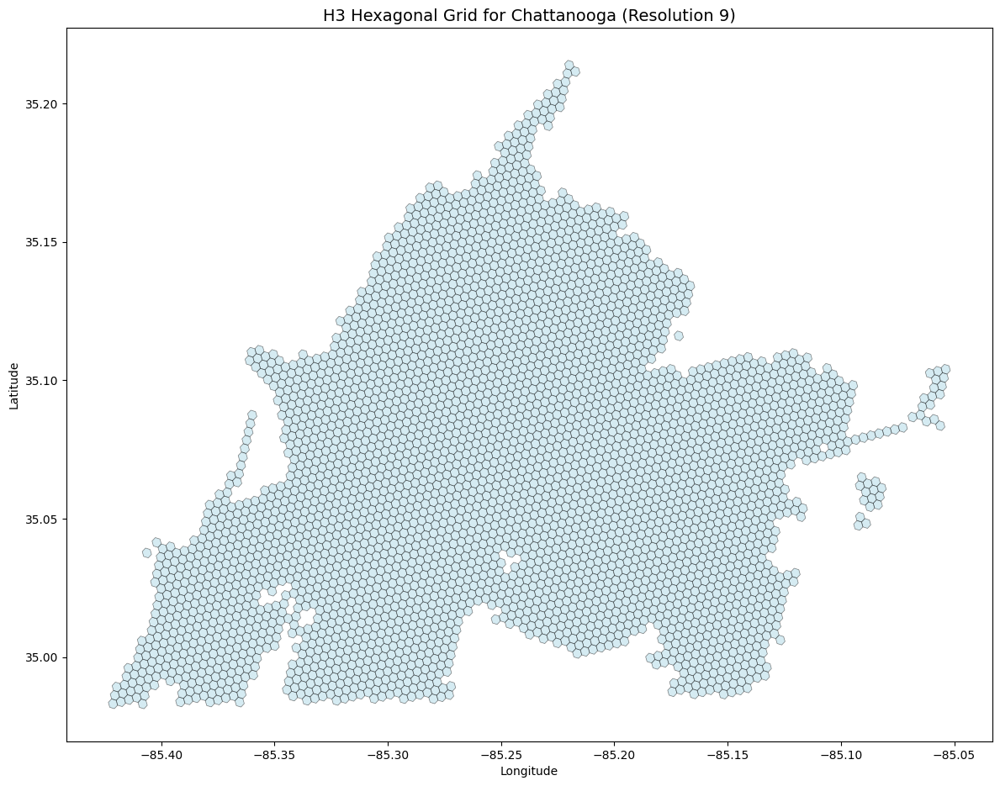

In [ ]:
hex_gdf_chatt_9.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Chattanooga (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_chatt.set_crs(epsg=4326, inplace=True)
hex_gdf_chatt = hex_gdf_chatt.to_crs(epsg=4269)
hex_gdf_chatt.to_file('data/hex_chatt_res7.geojson', driver='GeoJSON')

hex_gdf_chatt_8.set_crs(epsg=4326, inplace=True)
hex_gdf_chatt_8 = hex_gdf_chatt_8.to_crs(epsg=4269)
hex_gdf_chatt_8.to_file('data/hex_chatt_res8.geojson', driver='GeoJSON')

hex_gdf_chatt_9.set_crs(epsg=4326, inplace=True)
hex_gdf_chatt_9 = hex_gdf_chatt_9.to_crs(epsg=4269)
hex_gdf_chatt_9.to_file('data/hex_chatt_res9.geojson', driver='GeoJSON')

### Atlanta, Georgia, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Atlanta.

In [ ]:
# # Option 1: Load the downloaded graph from data/
# G_atlanta = ox.load_graphml('data/atlanta_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Atlanta, Georgia, USA"
G_atlanta = ox.graph_from_place(city_name, network_type='drive')

# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_atlanta = ox.add_edge_travel_times(ox.add_edge_speeds(G_atlanta))
ox.save_graphml(G_atlanta, filepath='data/atlanta_graph.graphml')

# Print network statistics
print(f"Atlanta - Number of nodes: {len(G_atlanta.nodes)}")
print(f"Atlanta - Number of edges: {len(G_atlanta.edges)}")

Atlanta - Number of nodes: 12905
Atlanta - Number of edges: 33628


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

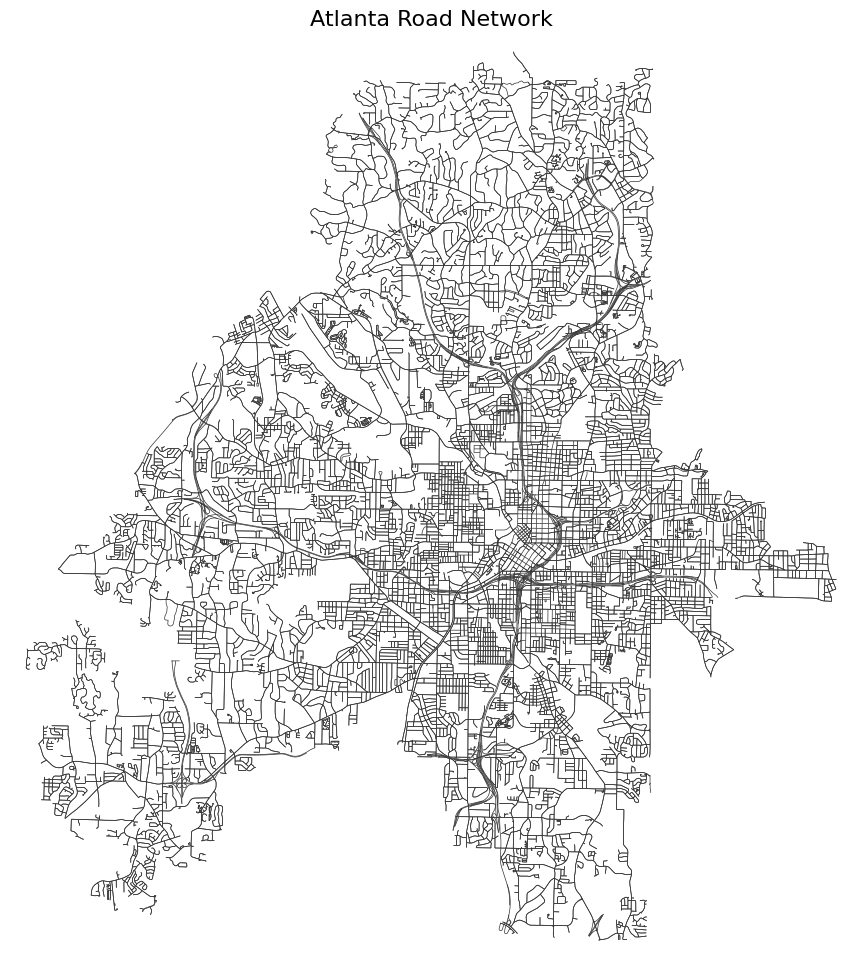

In [ ]:
# Visualize the Atlanta road network
fig, ax = ox.plot_graph(G_atlanta, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Atlanta Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [ ]:
# Get city boundary
boundary_atlanta = ox.geocode_to_gdf("Atlanta, Georgia, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

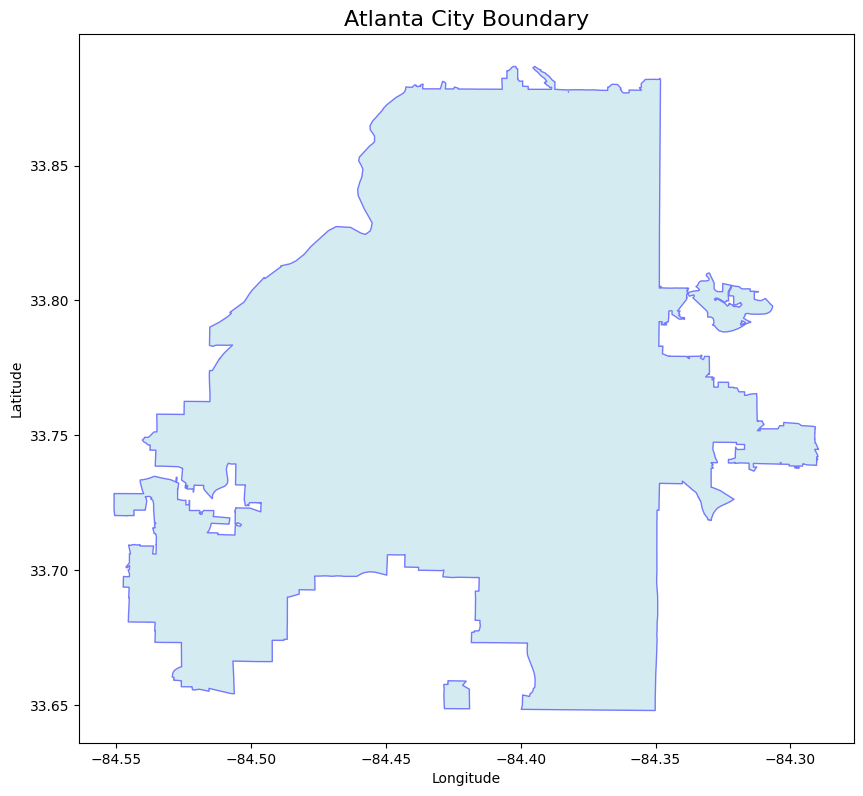

In [ ]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_atlanta]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Atlanta City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
These cells creates H3 hexagons at three resolutions (7, 8, 9) covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [ ]:
# H3 hexagon mapping for Atlanta
resolution = 7

hexagons_atlanta = h3.geo_to_cells(boundary_atlanta, resolution)
hex_polygons_atlanta = []
for hexagon in hexagons_atlanta:
    hex_polygons_atlanta.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_atlanta = gpd.GeoDataFrame(geometry=hex_polygons_atlanta)

hex_gdf_atlanta['id'] = hexagons_atlanta
hex_gdf_atlanta.set_index('id', inplace=True)
for hexid, row in hex_gdf_atlanta.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_atlanta.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_atlanta.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_atlanta, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_atlanta.at[hexid, 'center_node'] = center_node
    hex_gdf_atlanta.at[hexid, 'center_node_lat'] = G_atlanta.nodes[center_node]['y']
    hex_gdf_atlanta.at[hexid, 'center_node_lon'] = G_atlanta.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_atlanta.geometry = hex_gdf_atlanta.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Atlanta - Number of H3 hexagons: {len(hex_gdf_atlanta)}")

Atlanta - Number of H3 hexagons: 73


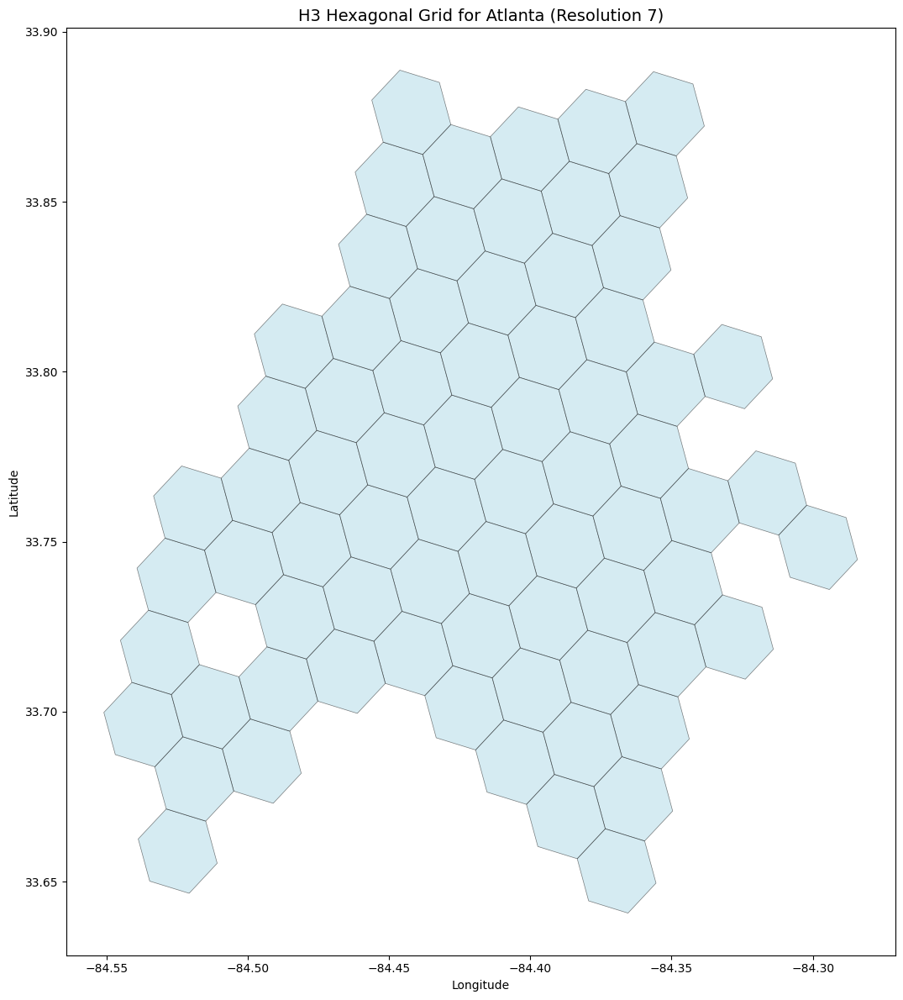

In [ ]:
hex_gdf_atlanta.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Atlanta (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Atlanta (Resolution 8)
resolution = 8
hexagons_atlanta_8 = h3.geo_to_cells(boundary_atlanta, resolution)
hex_polygons_atlanta_8 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_atlanta_8]
hex_gdf_atlanta_8 = gpd.GeoDataFrame(geometry=hex_polygons_atlanta_8)
hex_gdf_atlanta_8['id'] = hexagons_atlanta_8
hex_gdf_atlanta_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_atlanta_8.iterrows():
    hex_gdf_atlanta_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_atlanta_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_atlanta, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_atlanta_8.at[hexid, 'center_node'] = center_node
    hex_gdf_atlanta_8.at[hexid, 'center_node_lat'] = G_atlanta.nodes[center_node]['y']
    hex_gdf_atlanta_8.at[hexid, 'center_node_lon'] = G_atlanta.nodes[center_node]['x']
hex_gdf_atlanta_8.geometry = hex_gdf_atlanta_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Atlanta - Number of H3 hexagons (Resolution 8): {len(hex_gdf_atlanta_8)}")

Atlanta - Number of H3 hexagons (Resolution 8): 502


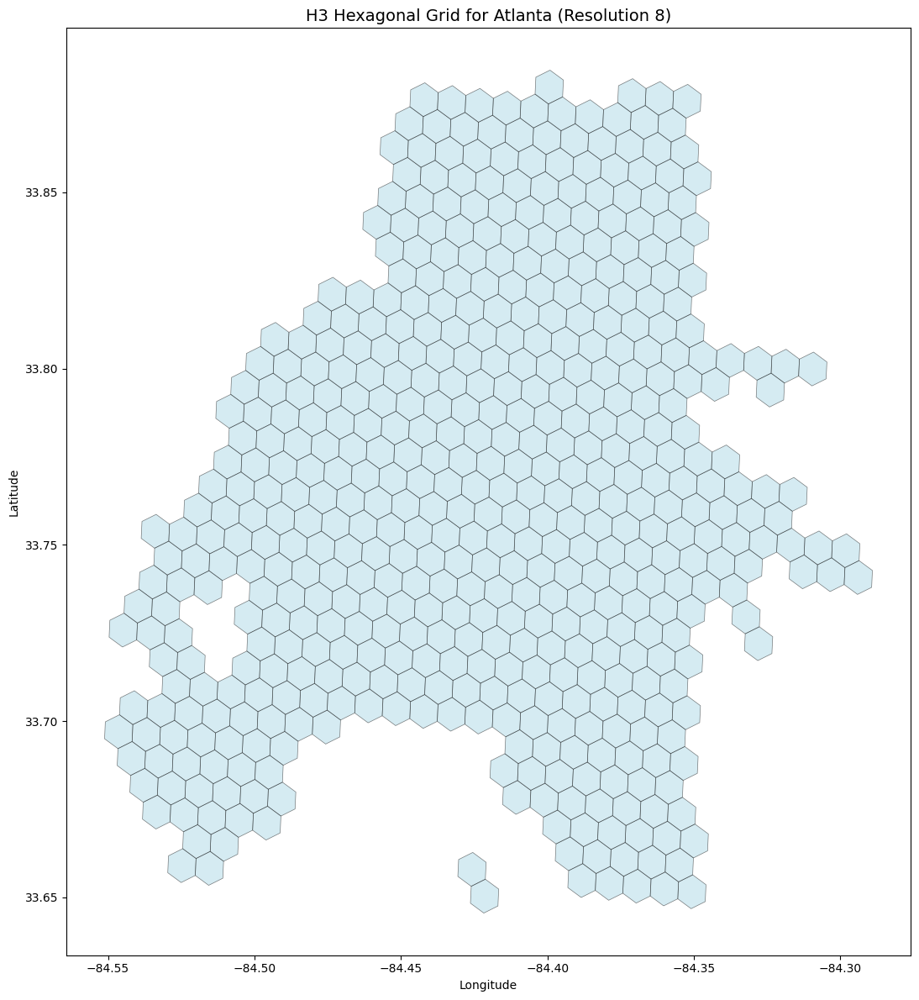

In [ ]:
hex_gdf_atlanta_8.plot(figsize=(12, 12), facecolor='lightblue', 
                       edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Atlanta (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Atlanta (Resolution 9)
resolution = 9
hexagons_atlanta_9 = h3.geo_to_cells(boundary_atlanta, resolution)
hex_polygons_atlanta_9 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_atlanta_9]
hex_gdf_atlanta_9 = gpd.GeoDataFrame(geometry=hex_polygons_atlanta_9)
hex_gdf_atlanta_9['id'] = hexagons_atlanta_9
hex_gdf_atlanta_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_atlanta_9.iterrows():
    hex_gdf_atlanta_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_atlanta_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_atlanta, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_atlanta_9.at[hexid, 'center_node'] = center_node
    hex_gdf_atlanta_9.at[hexid, 'center_node_lat'] = G_atlanta.nodes[center_node]['y']
    hex_gdf_atlanta_9.at[hexid, 'center_node_lon'] = G_atlanta.nodes[center_node]['x']
hex_gdf_atlanta_9.geometry = hex_gdf_atlanta_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Atlanta - Number of H3 hexagons (Resolution 9): {len(hex_gdf_atlanta_9)}")

Atlanta - Number of H3 hexagons (Resolution 9): 3537


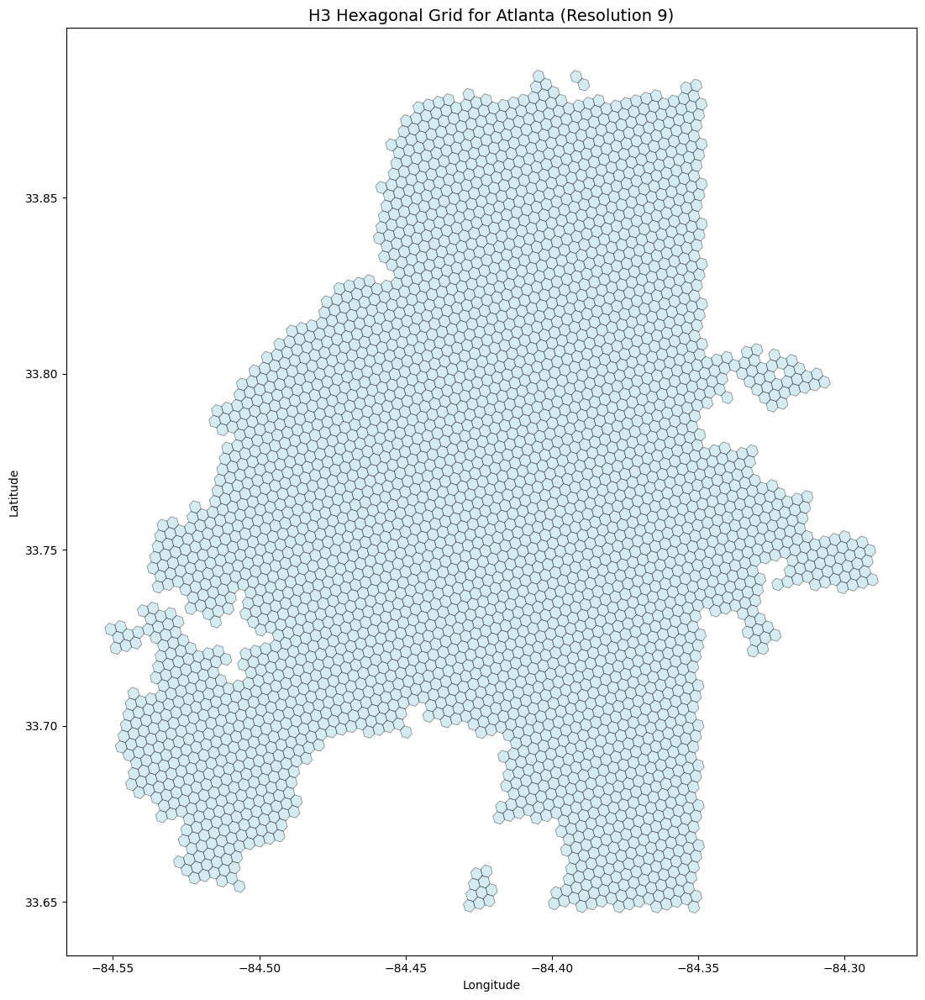

In [ ]:
hex_gdf_atlanta_9.plot(figsize=(12, 12), facecolor='lightblue', 
                       edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Atlanta (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_atlanta.set_crs(epsg=4326, inplace=True)
hex_gdf_atlanta = hex_gdf_atlanta.to_crs(epsg=4269)
hex_gdf_atlanta.to_file('data/hex_atlanta_res7.geojson', driver='GeoJSON')

hex_gdf_atlanta_8.set_crs(epsg=4326, inplace=True)
hex_gdf_atlanta_8 = hex_gdf_atlanta_8.to_crs(epsg=4269)
hex_gdf_atlanta_8.to_file('data/hex_atlanta_res8.geojson', driver='GeoJSON')

hex_gdf_atlanta_9.set_crs(epsg=4326, inplace=True)
hex_gdf_atlanta_9 = hex_gdf_atlanta_9.to_crs(epsg=4269)
hex_gdf_atlanta_9.to_file('data/hex_atlanta_res9.geojson', driver='GeoJSON')

### Boston, Massachusetts, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Boston.

In [6]:
# # Option 1: Load the downloaded graph from data/
# G_boston = ox.load_graphml('data/boston_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Boston, Massachusetts, USA"
G_boston = ox.graph_from_place(city_name, network_type='drive')

# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_boston = ox.add_edge_travel_times(ox.add_edge_speeds(G_boston))
ox.save_graphml(G_boston, filepath='data/boston_graph.graphml')

# Print network statistics
print(f"Boston - Number of nodes: {len(G_boston.nodes)}")
print(f"Boston - Number of edges: {len(G_boston.edges)}")

Boston - Number of nodes: 11408
Boston - Number of edges: 26086


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

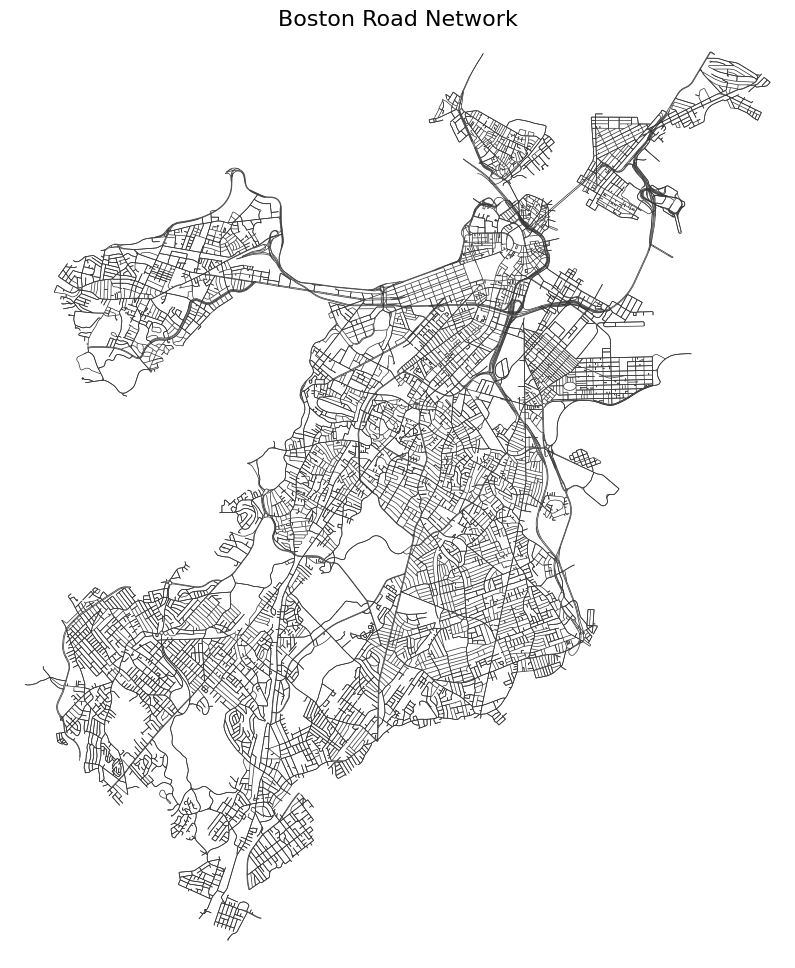

In [ ]:
# Visualize the Boston road network
fig, ax = ox.plot_graph(G_boston, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Boston Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [ ]:
# Get city boundary
boundary_boston = ox.geocode_to_gdf("Boston, Massachusetts, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

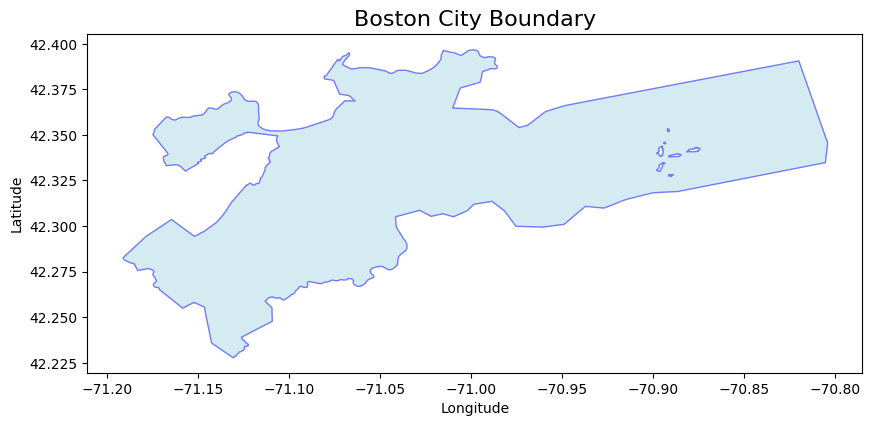

In [ ]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_boston]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Boston City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
This cell creates H3 hexagons at resolution 7 covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [ ]:
# H3 hexagon mapping for Boston
resolution = 7

hexagons_boston = h3.geo_to_cells(boundary_boston, resolution)
hex_polygons_boston = []
for hexagon in hexagons_boston:
    hex_polygons_boston.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_boston = gpd.GeoDataFrame(geometry=hex_polygons_boston)

hex_gdf_boston['id'] = hexagons_boston
hex_gdf_boston.set_index('id', inplace=True)
for hexid, row in hex_gdf_boston.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_boston.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_boston.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_boston, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_boston.at[hexid, 'center_node'] = center_node
    hex_gdf_boston.at[hexid, 'center_node_lat'] = G_boston.nodes[center_node]['y']
    hex_gdf_boston.at[hexid, 'center_node_lon'] = G_boston.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_boston.geometry = hex_gdf_boston.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Boston - Number of H3 hexagons: {len(hex_gdf_boston)}")

Boston - Number of H3 hexagons: 45


#### Visualize H3 Hexagons
This cell visualizes the H3 hexagonal grid, with each hexagon colored by its assigned center node.

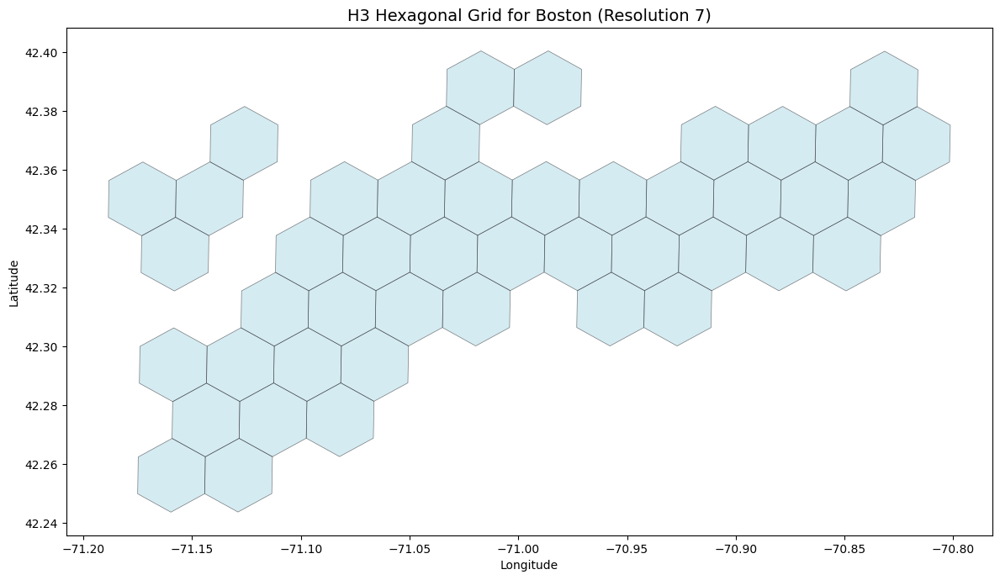

In [ ]:
hex_gdf_boston.plot(figsize=(12, 12), facecolor='lightblue', 
                    edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Boston (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Boston (Resolution 8)
resolution = 8
hexagons_boston_8 = h3.geo_to_cells(boundary_boston, resolution)
hex_polygons_boston_8 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_boston_8]
hex_gdf_boston_8 = gpd.GeoDataFrame(geometry=hex_polygons_boston_8)
hex_gdf_boston_8['id'] = hexagons_boston_8
hex_gdf_boston_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_boston_8.iterrows():
    hex_gdf_boston_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_boston_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_boston, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_boston_8.at[hexid, 'center_node'] = center_node
    hex_gdf_boston_8.at[hexid, 'center_node_lat'] = G_boston.nodes[center_node]['y']
    hex_gdf_boston_8.at[hexid, 'center_node_lon'] = G_boston.nodes[center_node]['x']
hex_gdf_boston_8.geometry = hex_gdf_boston_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Boston - Number of H3 hexagons (Resolution 8): {len(hex_gdf_boston_8)}")

Boston - Number of H3 hexagons (Resolution 8): 321


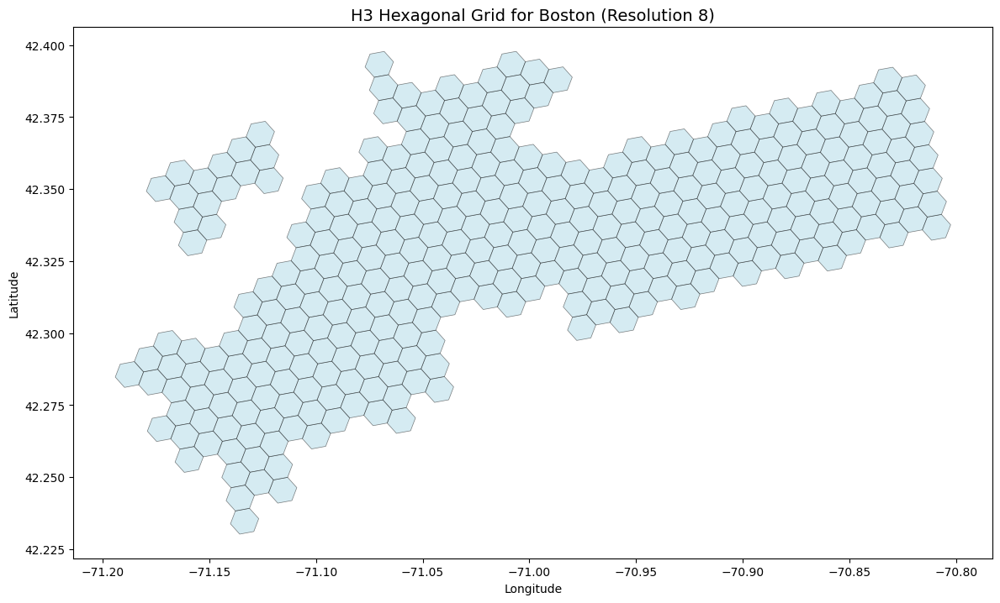

In [ ]:
hex_gdf_boston_8.plot(figsize=(12, 12), facecolor='lightblue', 
                      edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Boston (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Boston (Resolution 9)
resolution = 9
hexagons_boston_9 = h3.geo_to_cells(boundary_boston, resolution)
hex_polygons_boston_9 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_boston_9]
hex_gdf_boston_9 = gpd.GeoDataFrame(geometry=hex_polygons_boston_9)
hex_gdf_boston_9['id'] = hexagons_boston_9
hex_gdf_boston_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_boston_9.iterrows():
    hex_gdf_boston_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_boston_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_boston, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_boston_9.at[hexid, 'center_node'] = center_node
    hex_gdf_boston_9.at[hexid, 'center_node_lat'] = G_boston.nodes[center_node]['y']
    hex_gdf_boston_9.at[hexid, 'center_node_lon'] = G_boston.nodes[center_node]['x']
hex_gdf_boston_9.geometry = hex_gdf_boston_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Boston - Number of H3 hexagons (Resolution 9): {len(hex_gdf_boston_9)}")

Boston - Number of H3 hexagons (Resolution 9): 2260


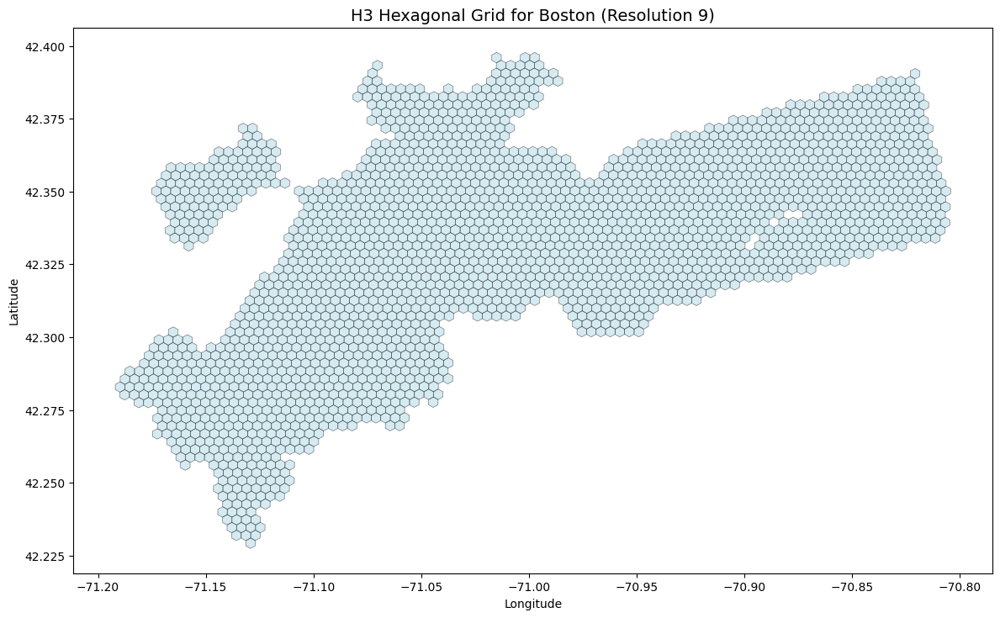

In [ ]:
hex_gdf_boston_9.plot(figsize=(12, 12), facecolor='lightblue', 
                      edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Boston (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_boston.set_crs(epsg=4326, inplace=True)
hex_gdf_boston = hex_gdf_boston.to_crs(epsg=4269)
hex_gdf_boston.to_file('data/hex_boston_res7.geojson', driver='GeoJSON')

hex_gdf_boston_8.set_crs(epsg=4326, inplace=True)
hex_gdf_boston_8 = hex_gdf_boston_8.to_crs(epsg=4269)
hex_gdf_boston_8.to_file('data/hex_boston_res8.geojson', driver='GeoJSON')

hex_gdf_boston_9.set_crs(epsg=4326, inplace=True)
hex_gdf_boston_9 = hex_gdf_boston_9.to_crs(epsg=4269)
hex_gdf_boston_9.to_file('data/hex_boston_res9.geojson', driver='GeoJSON')

### Los Angeles, California, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Los Angeles.

In [7]:
# # Option 1: Load the downloaded graph from data/
# G_la = ox.load_graphml('data/la_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Los Angeles, California, USA"
G_la = ox.graph_from_place(city_name, network_type='drive')

# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_la = ox.add_edge_travel_times(ox.add_edge_speeds(G_la))
ox.save_graphml(G_la, filepath='data/la_graph.graphml')

# Print network statistics
print(f"Los Angeles - Number of nodes: {len(G_la.nodes)}")
print(f"Los Angeles - Number of edges: {len(G_la.edges)}")

Los Angeles - Number of nodes: 49621
Los Angeles - Number of edges: 136113


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

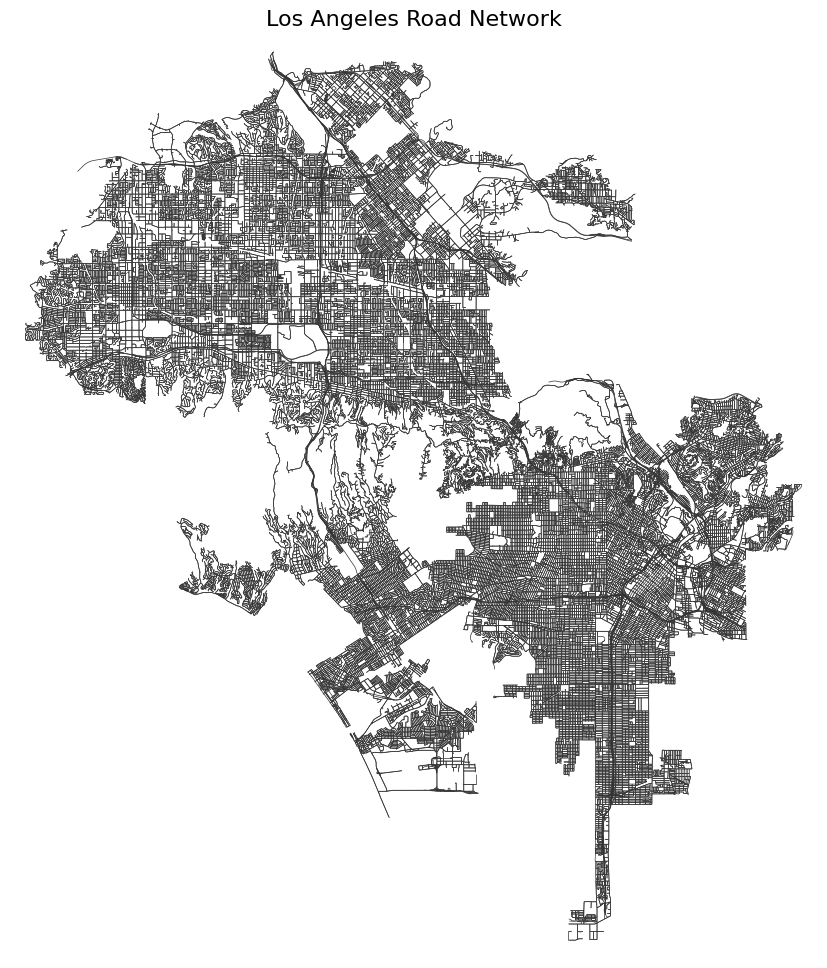

In [ ]:
# Visualize the Los Angeles road network
fig, ax = ox.plot_graph(G_la, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Los Angeles Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [ ]:
# Get city boundary
boundary_la = ox.geocode_to_gdf("Los Angeles, California, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

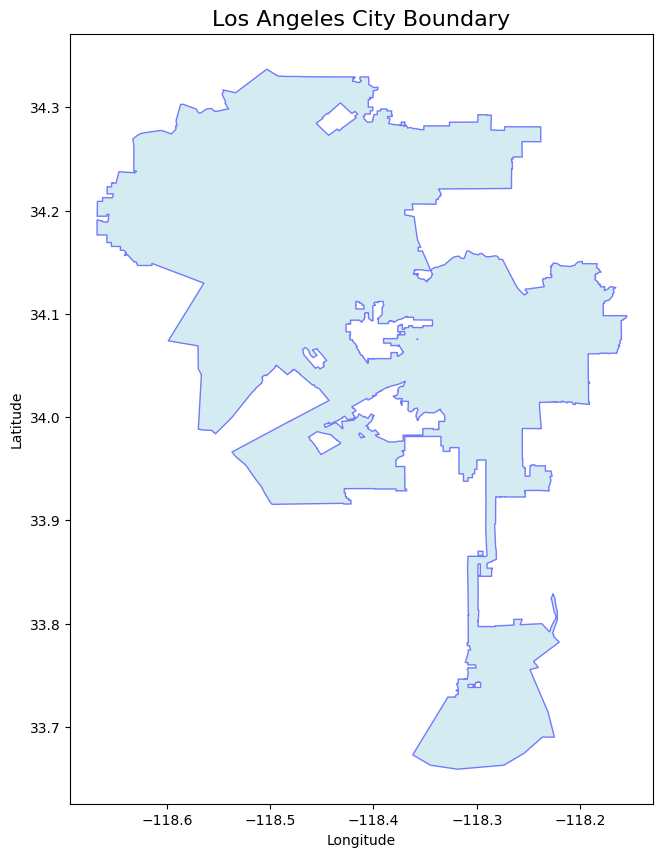

In [ ]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_la]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Los Angeles City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
This cell creates H3 hexagons at resolution 7 covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [ ]:
# H3 hexagon mapping for Los Angeles
resolution = 7

hexagons_la = h3.geo_to_cells(boundary_la, resolution)
hex_polygons_la = []
for hexagon in hexagons_la:
    hex_polygons_la.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_la = gpd.GeoDataFrame(geometry=hex_polygons_la)

hex_gdf_la['id'] = hexagons_la
hex_gdf_la.set_index('id', inplace=True)
for hexid, row in hex_gdf_la.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_la.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_la.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_la, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_la.at[hexid, 'center_node'] = center_node
    hex_gdf_la.at[hexid, 'center_node_lat'] = G_la.nodes[center_node]['y']
    hex_gdf_la.at[hexid, 'center_node_lon'] = G_la.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_la.geometry = hex_gdf_la.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Los Angeles - Number of H3 hexagons: {len(hex_gdf_la)}")

Los Angeles - Number of H3 hexagons: 238


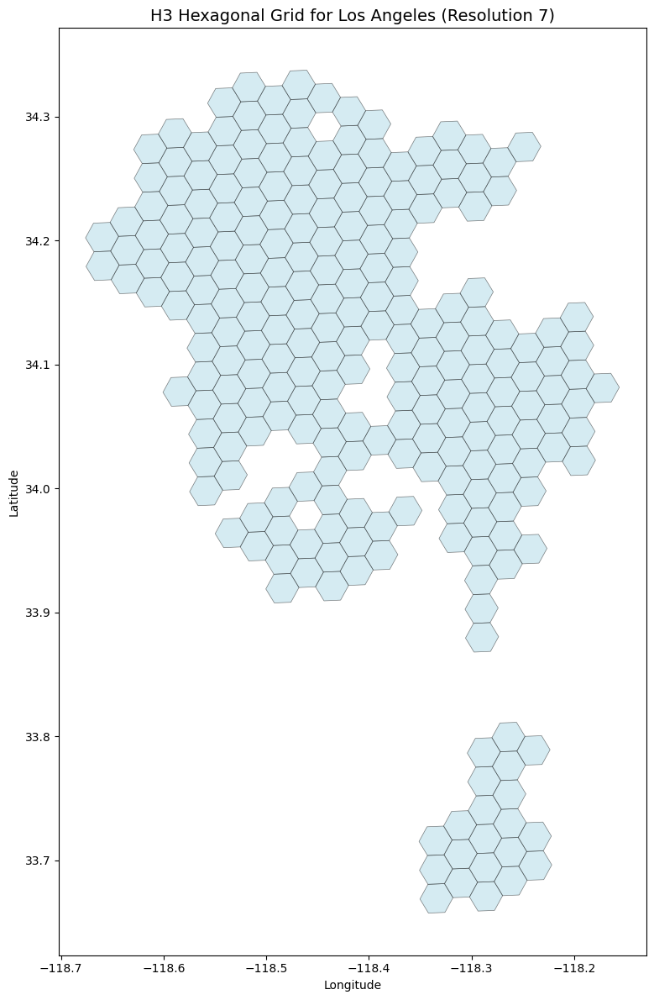

In [ ]:
hex_gdf_la.plot(figsize=(12, 12), facecolor='lightblue', 
                edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Los Angeles (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Los Angeles (Resolution 8)
resolution = 8
hexagons_la_8 = h3.geo_to_cells(boundary_la, resolution)
hex_polygons_la_8 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_la_8]
hex_gdf_la_8 = gpd.GeoDataFrame(geometry=hex_polygons_la_8)
hex_gdf_la_8['id'] = hexagons_la_8
hex_gdf_la_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_la_8.iterrows():
    hex_gdf_la_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_la_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_la, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_la_8.at[hexid, 'center_node'] = center_node
    hex_gdf_la_8.at[hexid, 'center_node_lat'] = G_la.nodes[center_node]['y']
    hex_gdf_la_8.at[hexid, 'center_node_lon'] = G_la.nodes[center_node]['x']
hex_gdf_la_8.geometry = hex_gdf_la_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Los Angeles - Number of H3 hexagons (Resolution 8): {len(hex_gdf_la_8)}")

Los Angeles - Number of H3 hexagons (Resolution 8): 1666


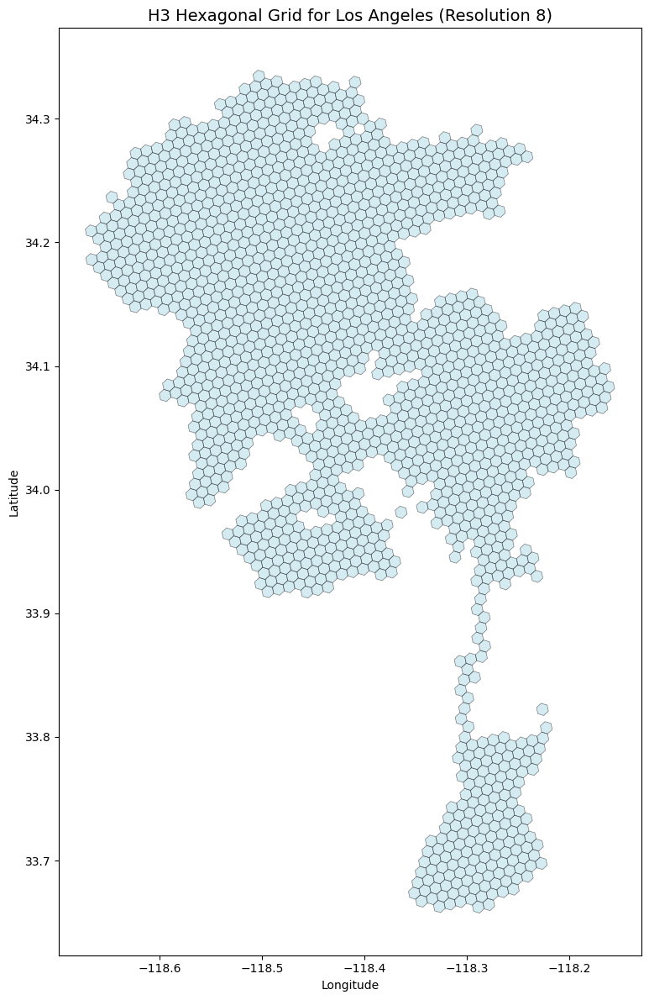

In [ ]:
hex_gdf_la_8.plot(figsize=(12, 12), facecolor='lightblue', 
                  edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Los Angeles (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Los Angeles (Resolution 9)
resolution = 9
hexagons_la_9 = h3.geo_to_cells(boundary_la, resolution)
hex_polygons_la_9 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_la_9]
hex_gdf_la_9 = gpd.GeoDataFrame(geometry=hex_polygons_la_9)
hex_gdf_la_9['id'] = hexagons_la_9
hex_gdf_la_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_la_9.iterrows():
    hex_gdf_la_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_la_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_la, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_la_9.at[hexid, 'center_node'] = center_node
    hex_gdf_la_9.at[hexid, 'center_node_lat'] = G_la.nodes[center_node]['y']
    hex_gdf_la_9.at[hexid, 'center_node_lon'] = G_la.nodes[center_node]['x']
hex_gdf_la_9.geometry = hex_gdf_la_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Los Angeles - Number of H3 hexagons (Resolution 9): {len(hex_gdf_la_9)}")

Los Angeles - Number of H3 hexagons (Resolution 9): 11610


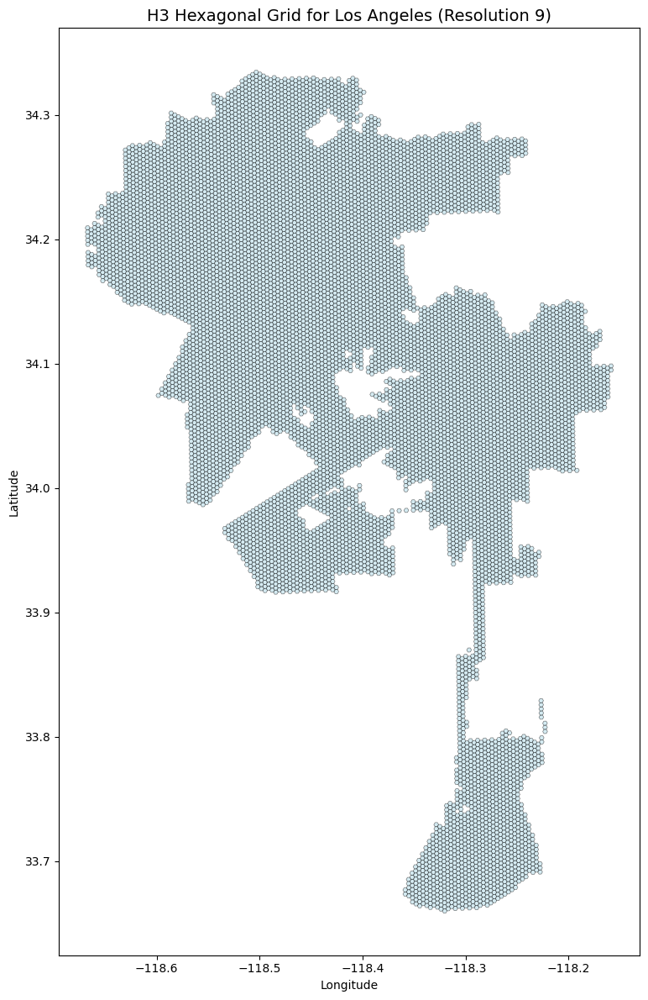

In [ ]:
hex_gdf_la_9.plot(figsize=(12, 12), facecolor='lightblue', 
                  edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Los Angeles (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_la.set_crs(epsg=4326, inplace=True)
hex_gdf_la = hex_gdf_la.to_crs(epsg=4269)
hex_gdf_la.to_file('data/hex_la_res7.geojson', driver='GeoJSON')

hex_gdf_la_8.set_crs(epsg=4326, inplace=True)
hex_gdf_la_8 = hex_gdf_la_8.to_crs(epsg=4269)
hex_gdf_la_8.to_file('data/hex_la_res8.geojson', driver='GeoJSON')

hex_gdf_la_9.set_crs(epsg=4326, inplace=True)
hex_gdf_la_9 = hex_gdf_la_9.to_crs(epsg=4269)
hex_gdf_la_9.to_file('data/hex_la_res9.geojson', driver='GeoJSON')

### Seattle, Washington, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Seattle.

In [8]:
# # Option 1: Load the downloaded graph from data/
# G_seattle = ox.load_graphml('data/seattle_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Seattle, Washington, USA"
G_seattle = ox.graph_from_place(city_name, network_type='drive')

# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_seattle = ox.add_edge_travel_times(ox.add_edge_speeds(G_seattle))
ox.save_graphml(G_seattle, filepath='data/seattle_graph.graphml')

# Print network statistics
print(f"Seattle - Number of nodes: {len(G_seattle.nodes)}")
print(f"Seattle - Number of edges: {len(G_seattle.edges)}")

Seattle - Number of nodes: 19064
Seattle - Number of edges: 50196


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

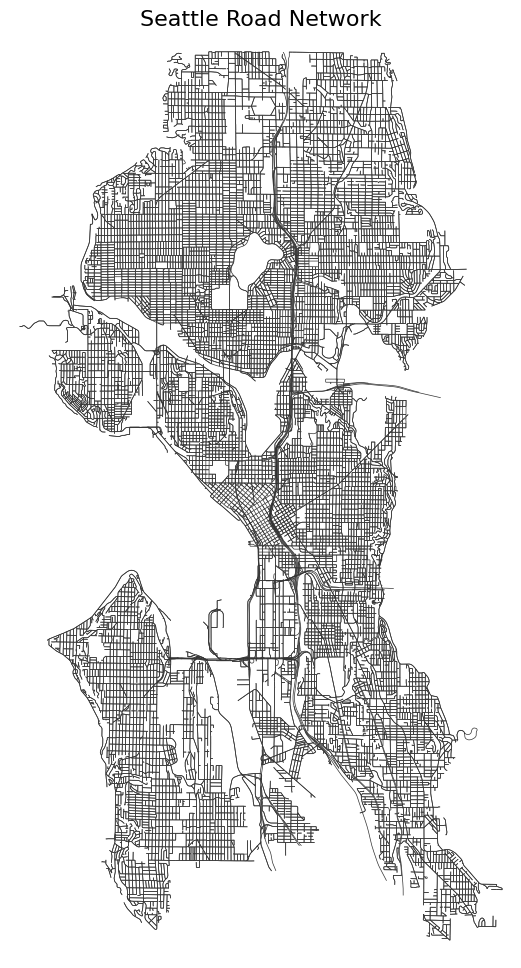

In [ ]:
# Visualize the Seattle road network
fig, ax = ox.plot_graph(G_seattle, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Seattle Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [ ]:
# Get city boundary
boundary_seattle = ox.geocode_to_gdf("Seattle, Washington, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

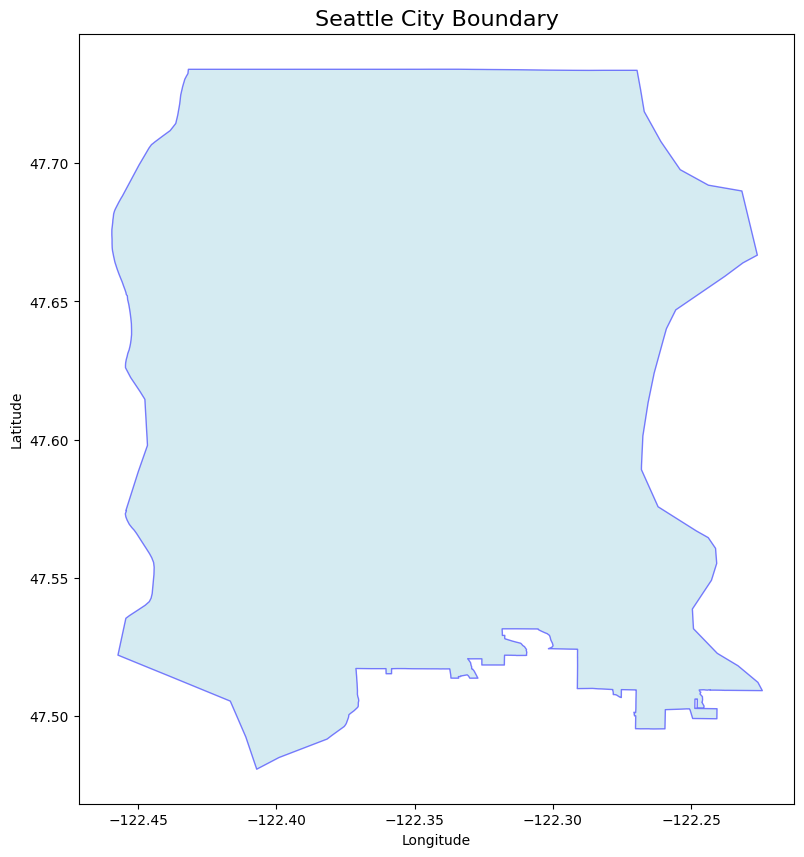

In [ ]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_seattle]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Seattle City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
This cell creates H3 hexagons at resolution 7 covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [ ]:
# H3 hexagon mapping for Seattle
resolution = 7

hexagons_seattle = h3.geo_to_cells(boundary_seattle, resolution)
hex_polygons_seattle = []
for hexagon in hexagons_seattle:
    hex_polygons_seattle.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_seattle = gpd.GeoDataFrame(geometry=hex_polygons_seattle)

hex_gdf_seattle['id'] = hexagons_seattle
hex_gdf_seattle.set_index('id', inplace=True)
for hexid, row in hex_gdf_seattle.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_seattle.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_seattle.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_seattle, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_seattle.at[hexid, 'center_node'] = center_node
    hex_gdf_seattle.at[hexid, 'center_node_lat'] = G_seattle.nodes[center_node]['y']
    hex_gdf_seattle.at[hexid, 'center_node_lon'] = G_seattle.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_seattle.geometry = hex_gdf_seattle.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Seattle - Number of H3 hexagons: {len(hex_gdf_seattle)}")

Seattle - Number of H3 hexagons: 82


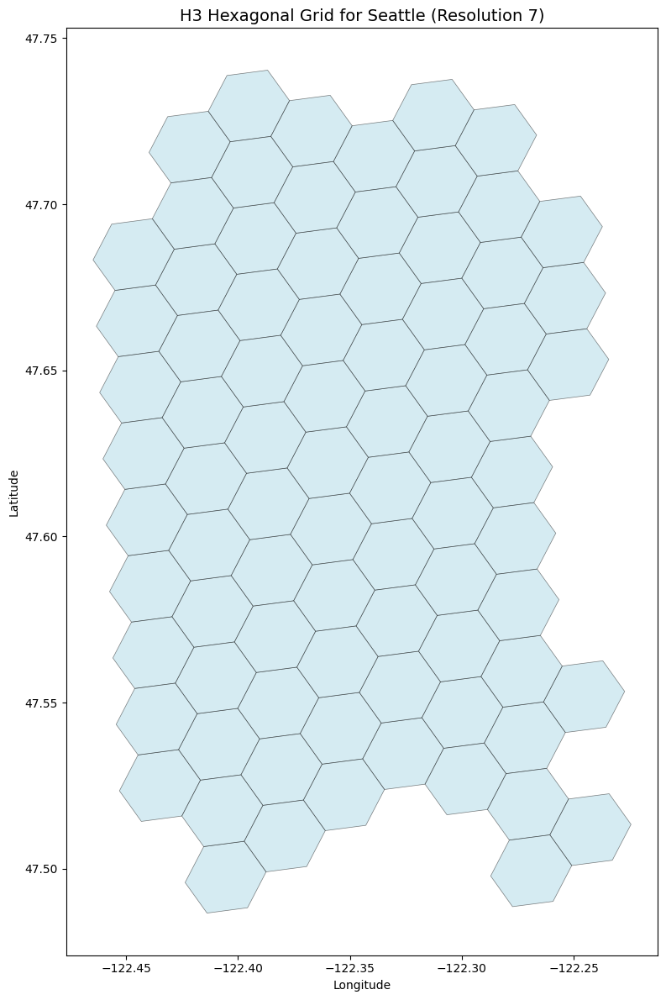

In [ ]:
hex_gdf_seattle.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Seattle (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Seattle (Resolution 8)
resolution = 8
hexagons_seattle_8 = h3.geo_to_cells(boundary_seattle, resolution)
hex_polygons_seattle_8 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_seattle_8]
hex_gdf_seattle_8 = gpd.GeoDataFrame(geometry=hex_polygons_seattle_8)
hex_gdf_seattle_8['id'] = hexagons_seattle_8
hex_gdf_seattle_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_seattle_8.iterrows():
    hex_gdf_seattle_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_seattle_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_seattle, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_seattle_8.at[hexid, 'center_node'] = center_node
    hex_gdf_seattle_8.at[hexid, 'center_node_lat'] = G_seattle.nodes[center_node]['y']
    hex_gdf_seattle_8.at[hexid, 'center_node_lon'] = G_seattle.nodes[center_node]['x']
hex_gdf_seattle_8.geometry = hex_gdf_seattle_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Seattle - Number of H3 hexagons (Resolution 8): {len(hex_gdf_seattle_8)}")

Seattle - Number of H3 hexagons (Resolution 8): 572


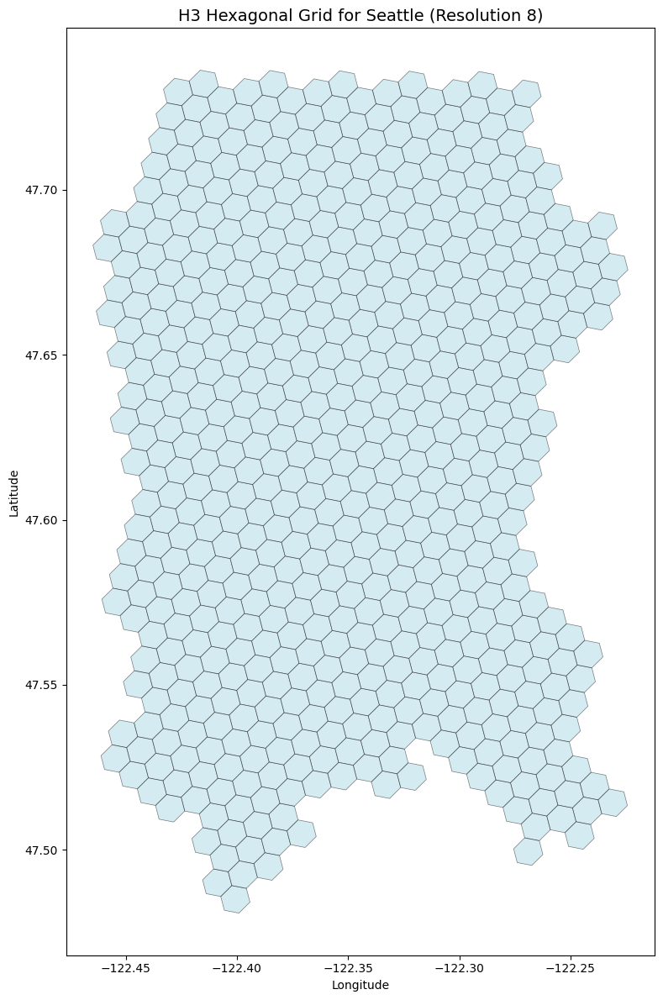

In [ ]:
hex_gdf_seattle_8.plot(figsize=(12, 12), facecolor='lightblue', 
                       edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Seattle (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Seattle (Resolution 9)
resolution = 9
hexagons_seattle_9 = h3.geo_to_cells(boundary_seattle, resolution)
hex_polygons_seattle_9 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_seattle_9]
hex_gdf_seattle_9 = gpd.GeoDataFrame(geometry=hex_polygons_seattle_9)
hex_gdf_seattle_9['id'] = hexagons_seattle_9
hex_gdf_seattle_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_seattle_9.iterrows():
    hex_gdf_seattle_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_seattle_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_seattle, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_seattle_9.at[hexid, 'center_node'] = center_node
    hex_gdf_seattle_9.at[hexid, 'center_node_lat'] = G_seattle.nodes[center_node]['y']
    hex_gdf_seattle_9.at[hexid, 'center_node_lon'] = G_seattle.nodes[center_node]['x']
hex_gdf_seattle_9.geometry = hex_gdf_seattle_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Seattle - Number of H3 hexagons (Resolution 9): {len(hex_gdf_seattle_9)}")

Seattle - Number of H3 hexagons (Resolution 9): 4012


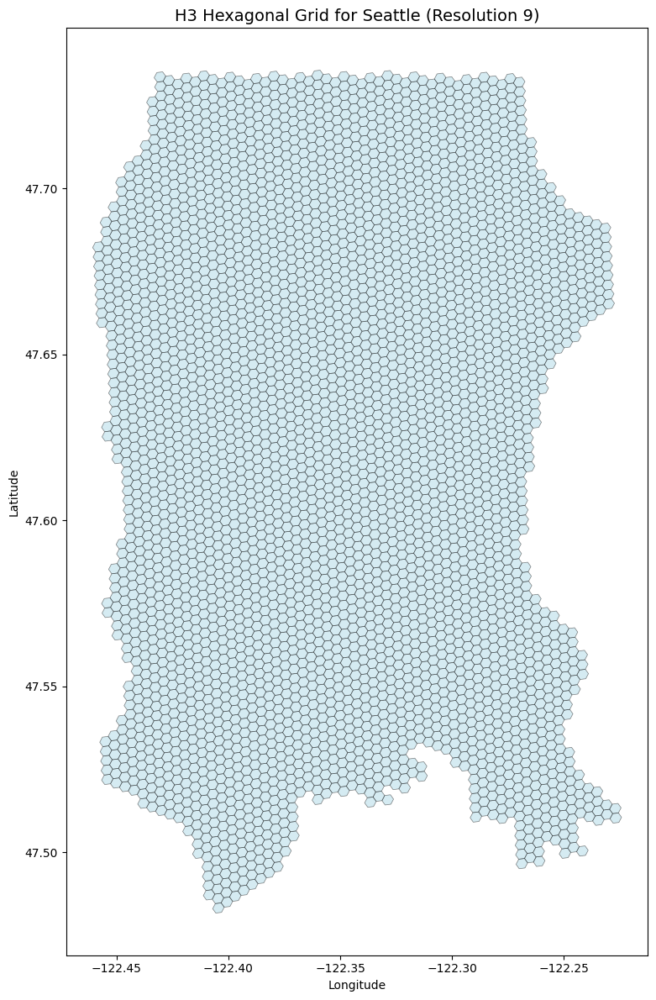

In [ ]:
hex_gdf_seattle_9.plot(figsize=(12, 12), facecolor='lightblue', 
                       edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Seattle (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_seattle.set_crs(epsg=4326, inplace=True)
hex_gdf_seattle = hex_gdf_seattle.to_crs(epsg=4269)
hex_gdf_seattle.to_file('data/hex_seattle_res7.geojson', driver='GeoJSON')

hex_gdf_seattle_8.set_crs(epsg=4326, inplace=True)
hex_gdf_seattle_8 = hex_gdf_seattle_8.to_crs(epsg=4269)
hex_gdf_seattle_8.to_file('data/hex_seattle_res8.geojson', driver='GeoJSON')

hex_gdf_seattle_9.set_crs(epsg=4326, inplace=True)
hex_gdf_seattle_9 = hex_gdf_seattle_9.to_crs(epsg=4269)
hex_gdf_seattle_9.to_file('data/hex_seattle_res9.geojson', driver='GeoJSON')

### Miami, Florida, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Miami.

In [9]:
# # Option 1: Load the downloaded graph from data/
# G_miami = ox.load_graphml('data/miami_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Miami, Florida, USA"
G_miami = ox.graph_from_place(city_name, network_type='drive')
# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_miami = ox.add_edge_travel_times(ox.add_edge_speeds(G_miami))
ox.save_graphml(G_miami, filepath='data/miami_graph.graphml')

# Print network statistics
print(f"Miami - Number of nodes: {len(G_miami.nodes)}")
print(f"Miami - Number of edges: {len(G_miami.edges)}")

Miami - Number of nodes: 9086
Miami - Number of edges: 23558


#### Visualize Road Network
This cell displays basic statistics (number of nodes and edges) and visualizes the road network graph.

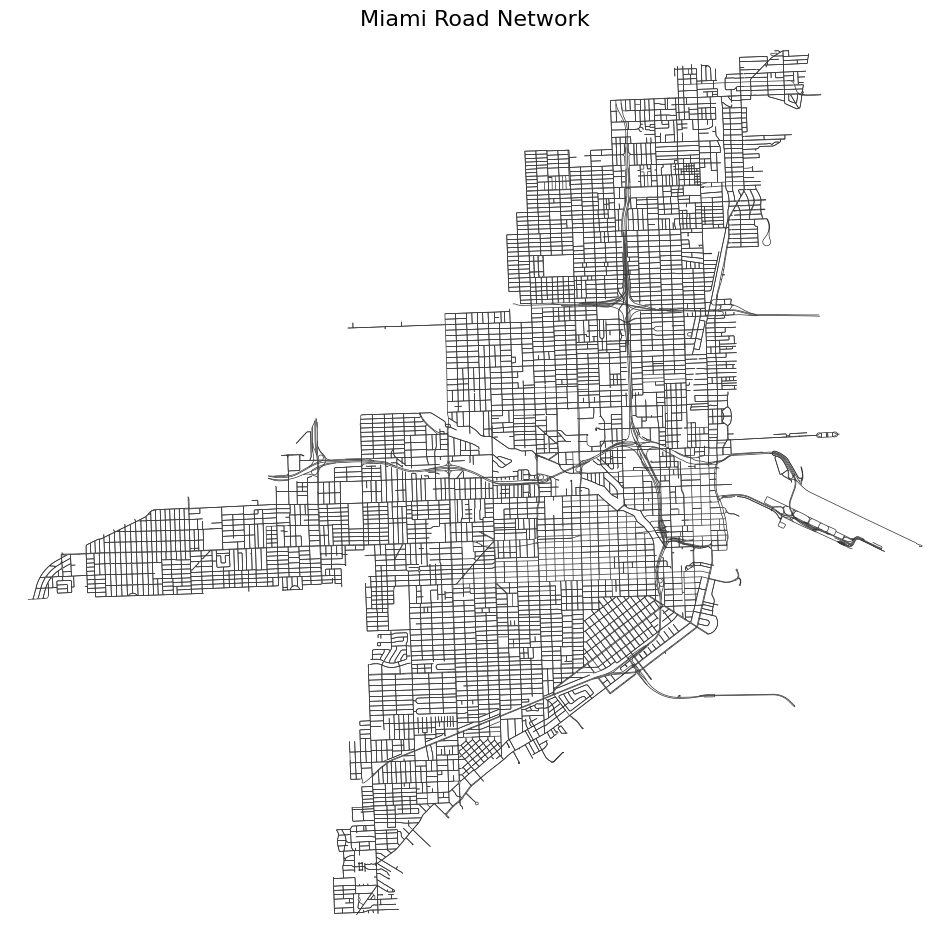

In [ ]:
# Visualize the Miami road network
fig, ax = ox.plot_graph(G_miami, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Miami Road Network', fontsize=16)
plt.show()

#### Load City Boundary
This cell geocodes the city name to obtain the administrative boundary polygon using OSMnx.

In [ ]:
# Get city boundary
boundary_miami = ox.geocode_to_gdf("Miami, Florida, USA").geometry.iloc[0]

#### Visualize City Boundary
This cell visualizes the city boundary as a polygon with light blue fill.

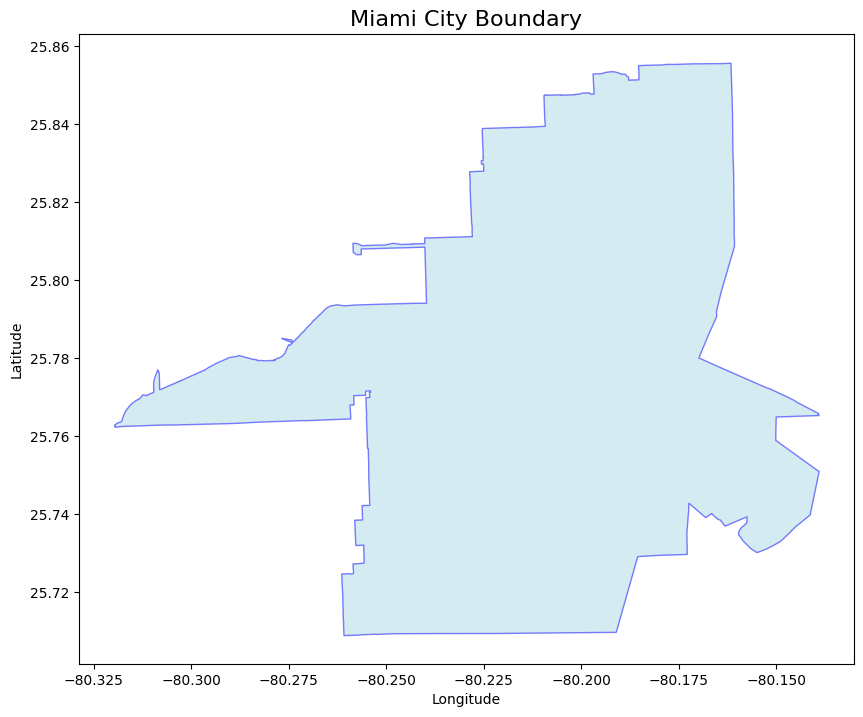

In [ ]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_miami]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Miami City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#### H3 Hexagonal Spatial Indexing
This cell creates H3 hexagons at resolution 7 covering the city boundary. For each hexagon, it calculates the centroid and finds the nearest road network node, which will serve as the center point for that hexagonal zone.

In [ ]:
# H3 hexagon mapping for Miami
resolution = 7

hexagons_miami = h3.geo_to_cells(boundary_miami, resolution)
hex_polygons_miami = []
for hexagon in hexagons_miami:
    hex_polygons_miami.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_miami = gpd.GeoDataFrame(geometry=hex_polygons_miami)

hex_gdf_miami['id'] = hexagons_miami
hex_gdf_miami.set_index('id', inplace=True)
for hexid, row in hex_gdf_miami.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_miami.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_miami.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_miami, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_miami.at[hexid, 'center_node'] = center_node
    hex_gdf_miami.at[hexid, 'center_node_lat'] = G_miami.nodes[center_node]['y']
    hex_gdf_miami.at[hexid, 'center_node_lon'] = G_miami.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_miami.geometry = hex_gdf_miami.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))

print(f"Miami - Number of H3 hexagons: {len(hex_gdf_miami)}")

Miami - Number of H3 hexagons: 31


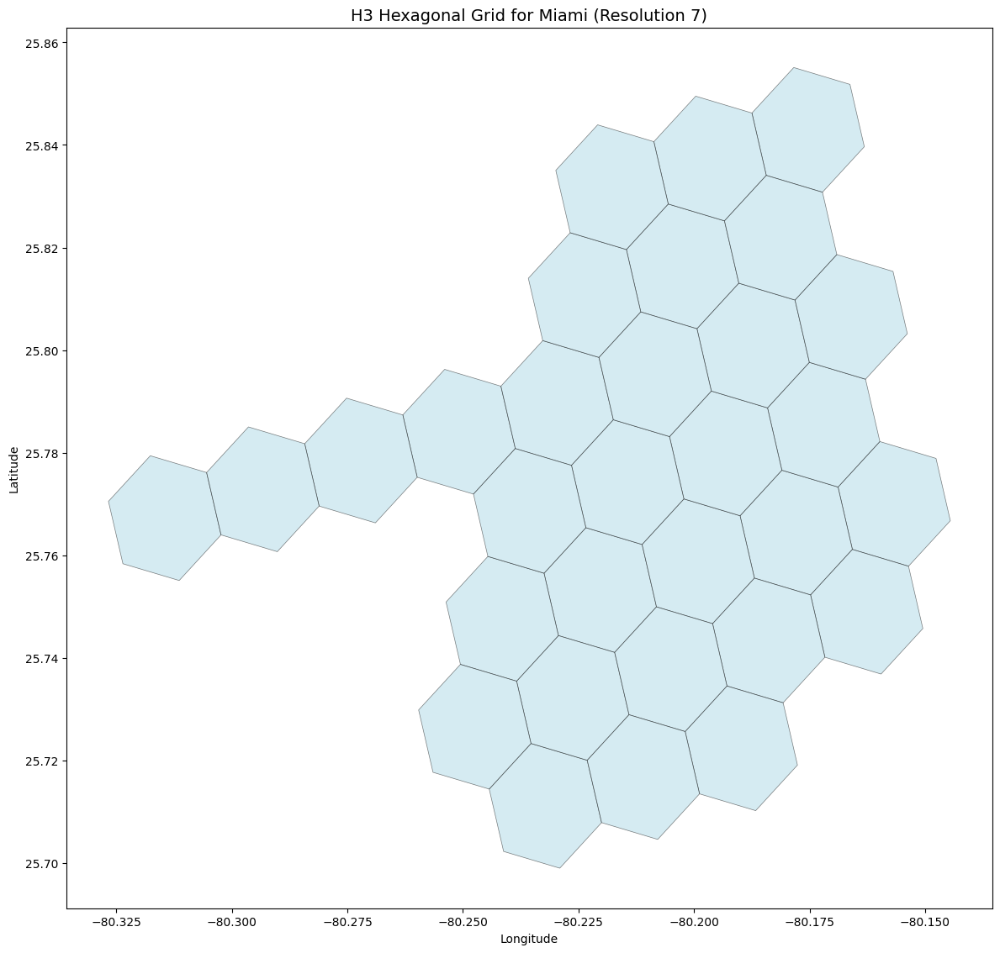

In [ ]:
hex_gdf_miami.plot(figsize=(12, 12), facecolor='lightblue', 
                   edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Miami (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Miami (Resolution 8)
resolution = 8
hexagons_miami_8 = h3.geo_to_cells(boundary_miami, resolution)
hex_polygons_miami_8 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_miami_8]
hex_gdf_miami_8 = gpd.GeoDataFrame(geometry=hex_polygons_miami_8)
hex_gdf_miami_8['id'] = hexagons_miami_8
hex_gdf_miami_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_miami_8.iterrows():
    hex_gdf_miami_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_miami_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_miami, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_miami_8.at[hexid, 'center_node'] = center_node
    hex_gdf_miami_8.at[hexid, 'center_node_lat'] = G_miami.nodes[center_node]['y']
    hex_gdf_miami_8.at[hexid, 'center_node_lon'] = G_miami.nodes[center_node]['x']
hex_gdf_miami_8.geometry = hex_gdf_miami_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Miami - Number of H3 hexagons (Resolution 8): {len(hex_gdf_miami_8)}")

Miami - Number of H3 hexagons (Resolution 8): 220


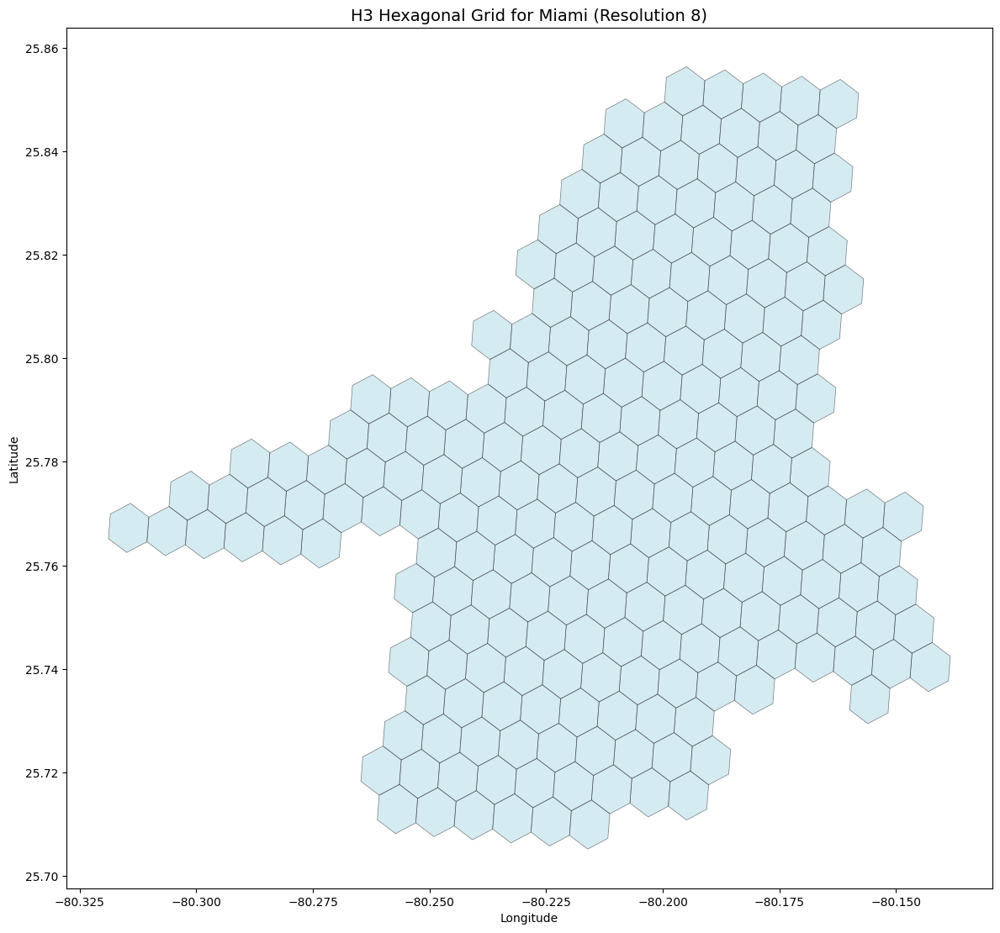

In [ ]:
hex_gdf_miami_8.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Miami (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# H3 hexagon mapping for Miami (Resolution 9)
resolution = 9
hexagons_miami_9 = h3.geo_to_cells(boundary_miami, resolution)
hex_polygons_miami_9 = [Polygon(h3.cell_to_boundary(h)) for h in hexagons_miami_9]
hex_gdf_miami_9 = gpd.GeoDataFrame(geometry=hex_polygons_miami_9)
hex_gdf_miami_9['id'] = hexagons_miami_9
hex_gdf_miami_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_miami_9.iterrows():
    hex_gdf_miami_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_miami_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    center_node = int(ox.distance.nearest_nodes(G_miami, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_miami_9.at[hexid, 'center_node'] = center_node
    hex_gdf_miami_9.at[hexid, 'center_node_lat'] = G_miami.nodes[center_node]['y']
    hex_gdf_miami_9.at[hexid, 'center_node_lon'] = G_miami.nodes[center_node]['x']
hex_gdf_miami_9.geometry = hex_gdf_miami_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Miami - Number of H3 hexagons (Resolution 9): {len(hex_gdf_miami_9)}")

Miami - Number of H3 hexagons (Resolution 9): 1530


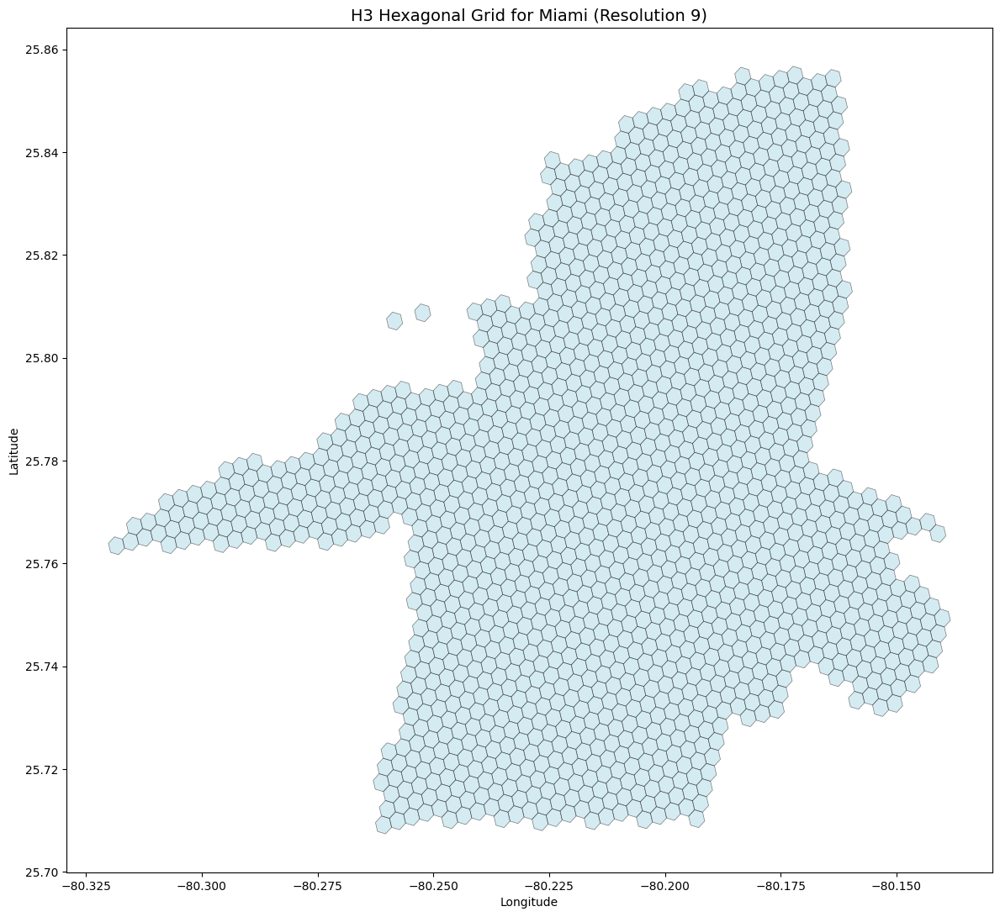

In [ ]:
hex_gdf_miami_9.plot(figsize=(12, 12), facecolor='lightblue', 
                     edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Miami (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [ ]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_miami.set_crs(epsg=4326, inplace=True)
hex_gdf_miami = hex_gdf_miami.to_crs(epsg=4269)
hex_gdf_miami.to_file('data/hex_miami_res7.geojson', driver='GeoJSON')

hex_gdf_miami_8.set_crs(epsg=4326, inplace=True)
hex_gdf_miami_8 = hex_gdf_miami_8.to_crs(epsg=4269)
hex_gdf_miami_8.to_file('data/hex_miami_res8.geojson', driver='GeoJSON')

hex_gdf_miami_9.set_crs(epsg=4326, inplace=True)
hex_gdf_miami_9 = hex_gdf_miami_9.to_crs(epsg=4269)
hex_gdf_miami_9.to_file('data/hex_miami_res9.geojson', driver='GeoJSON')

### Nashville, Tennessee, USA

#### Load Road Network
This cell loads the road network graph from a saved GraphML file (Option 1) or downloads it fresh from OpenStreetMap using OSMnx (Option 2). The network includes all drivable roads in Miami.

In [10]:
# # Option 1: Load the downloaded graph from data/
# G_nash = ox.load_graphml('data/nashville_graph.graphml')

# # Option 2: Download it from the internet if not in data/ (commented out if already downloaded)
city_name = "Nashville, Tennessee, USA"
G_nashville = ox.graph_from_place(city_name, network_type='drive')
# Add travel times to the graph. This uses OSMnx to estimate speeds based on road types and calculate travel times
G_nashville = ox.add_edge_travel_times(ox.add_edge_speeds(G_nashville))
ox.save_graphml(G_nashville, filepath='data/nashville_graph.graphml')

# Print network statistics
print(f"Nashville - Number of nodes: {len(G_nashville.nodes)}")
print(f"Nashville - Number of edges: {len(G_nashville.edges)}")

Nashville - Number of nodes: 22470
Nashville - Number of edges: 55796


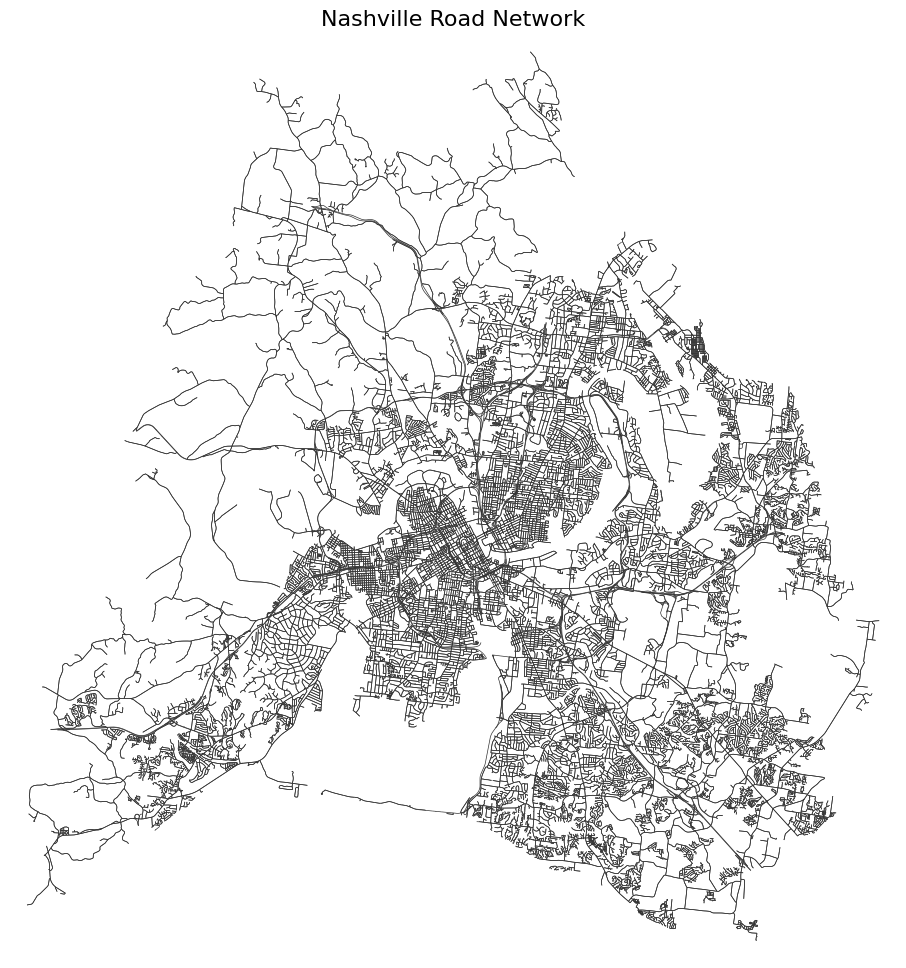

In [11]:
# Visualize the Nashville road network
fig, ax = ox.plot_graph(G_nashville, node_size=0, edge_linewidth=0.5, figsize=(12, 12), 
                        bgcolor='white', edge_color='#333333', show=False, close=False)
ax.set_title('Nashville Road Network', fontsize=16)
plt.show()

In [12]:
# Get city boundary
boundary_nashville = ox.geocode_to_gdf("Nashville, Tennessee, USA").geometry.iloc[0]

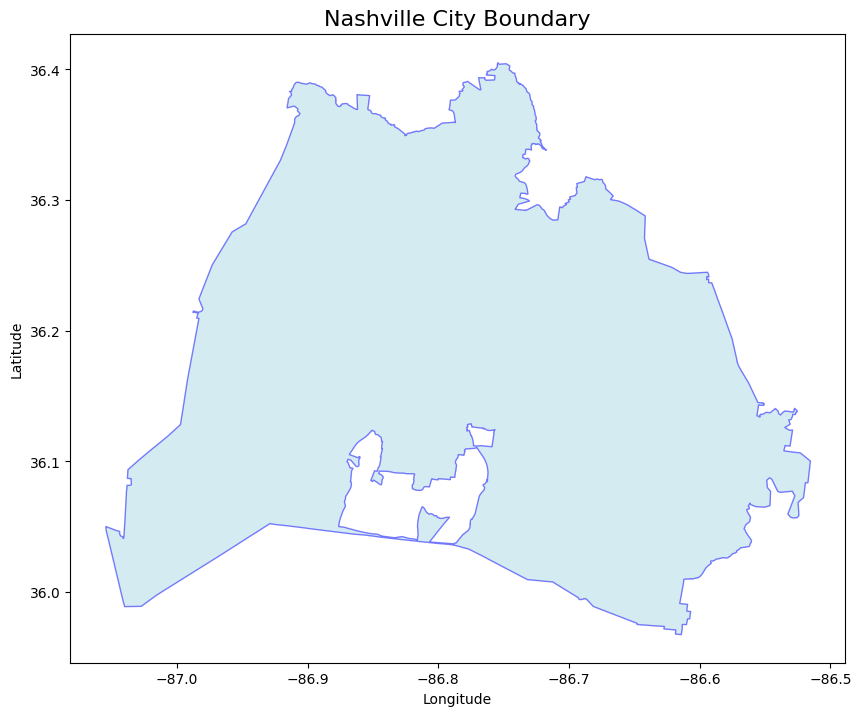

In [13]:
# Visualize the city boundary
fig, ax = plt.subplots(figsize=(10, 10))
gpd.GeoSeries([boundary_nashville]).plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.5)
ax.set_title('Nashville City Boundary', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

Resolution 7

In [14]:
# H3 hexagon mapping for Miami
resolution = 7

hexagons_nashville = h3.geo_to_cells(boundary_nashville, resolution)
hex_polygons_nashville = []
for hexagon in hexagons_nashville:
    hex_polygons_nashville.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_nashville = gpd.GeoDataFrame(geometry=hex_polygons_nashville)

hex_gdf_nashville['id'] = hexagons_nashville
hex_gdf_nashville.set_index('id', inplace=True)
for hexid, row in hex_gdf_nashville.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_nashville.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_nashville.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_nashville, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_nashville.at[hexid, 'center_node'] = center_node
    hex_gdf_nashville.at[hexid, 'center_node_lat'] = G_nashville.nodes[center_node]['y']
    hex_gdf_nashville.at[hexid, 'center_node_lon'] = G_nashville.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_nashville.geometry = hex_gdf_nashville.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Nashville - Number of H3 hexagons: {len(hex_gdf_nashville)}")

Nashville - Number of H3 hexagons: 257


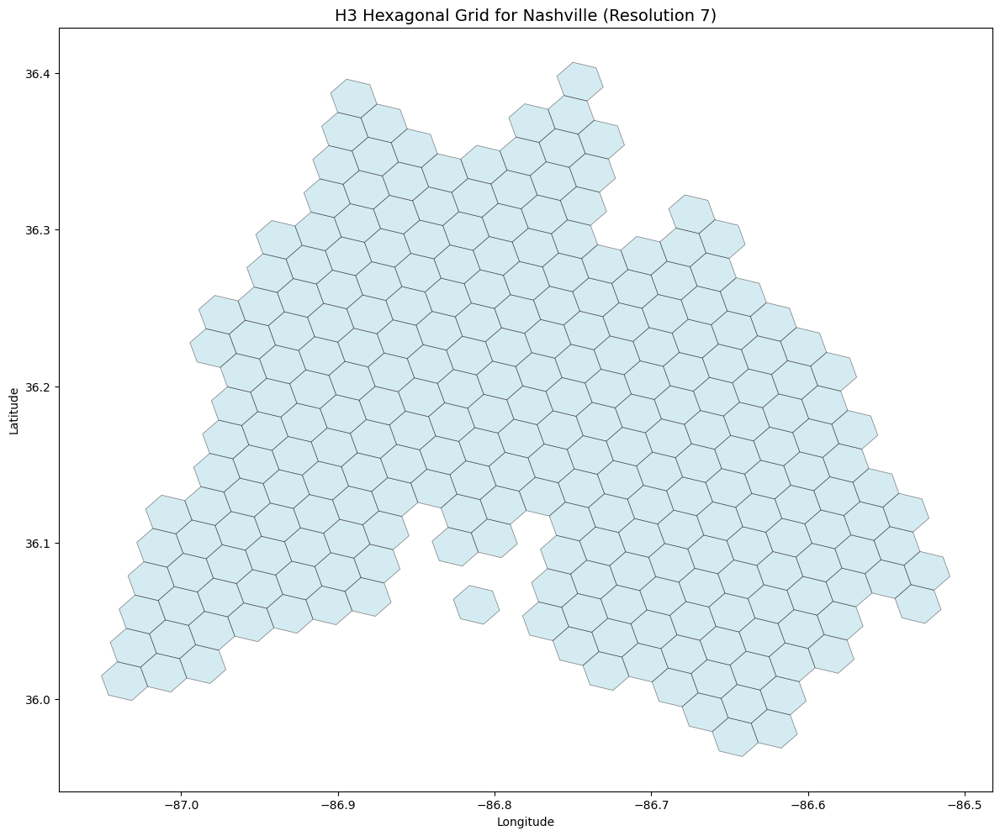

In [15]:
hex_gdf_nashville.plot(figsize=(12, 12), facecolor='lightblue', 
                   edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Nashville (Resolution 7)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

Resolution 8

In [16]:
# H3 hexagon mapping for Miami
resolution = 8

hexagons_nashville_8 = h3.geo_to_cells(boundary_nashville, resolution)
hex_polygons_nashville_8 = []
for hexagon in hexagons_nashville_8:
    hex_polygons_nashville_8.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_nashville_8 = gpd.GeoDataFrame(geometry=hex_polygons_nashville_8)

hex_gdf_nashville_8['id'] = hexagons_nashville_8
hex_gdf_nashville_8.set_index('id', inplace=True)
for hexid, row in hex_gdf_nashville_8.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_nashville_8.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_nashville_8.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_nashville, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_nashville_8.at[hexid, 'center_node'] = center_node
    hex_gdf_nashville_8.at[hexid, 'center_node_lat'] = G_nashville.nodes[center_node]['y']
    hex_gdf_nashville_8.at[hexid, 'center_node_lon'] = G_nashville.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_nashville_8.geometry = hex_gdf_nashville_8.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Nashville - Number of H3 hexagons: {len(hex_gdf_nashville_8)}")

Nashville - Number of H3 hexagons: 1803


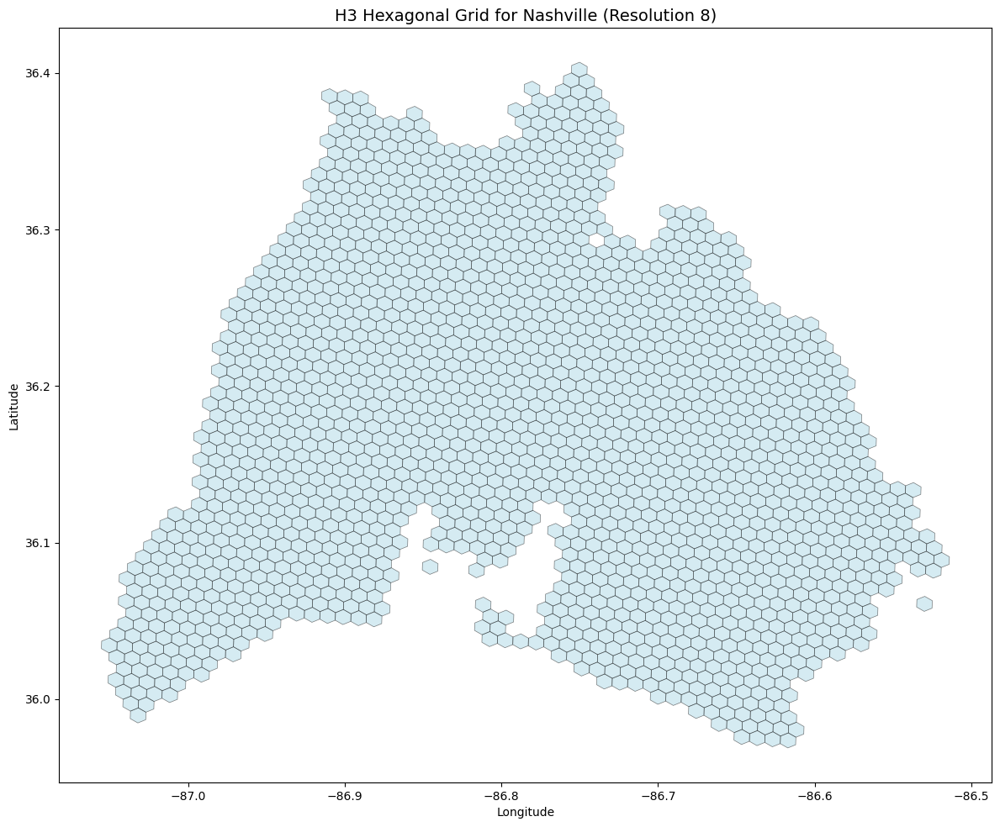

In [17]:
hex_gdf_nashville_8.plot(figsize=(12, 12), facecolor='lightblue', 
                   edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Nashville (Resolution 8)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

Resolution 9

In [18]:
# H3 hexagon mapping for Miami
resolution = 9

hexagons_nashville_9 = h3.geo_to_cells(boundary_nashville, resolution)
hex_polygons_nashville_9 = []
for hexagon in hexagons_nashville_9:
    hex_polygons_nashville_9.append(Polygon(h3.cell_to_boundary(hexagon)))

# Create a GeoDataFrame from the hexagons
hex_gdf_nashville_9 = gpd.GeoDataFrame(geometry=hex_polygons_nashville_9)

hex_gdf_nashville_9['id'] = hexagons_nashville_9
hex_gdf_nashville_9.set_index('id', inplace=True)
for hexid, row in hex_gdf_nashville_9.iterrows():
    
    # Calculate the centroid of each hexagon
    hex_gdf_nashville_9.at[hexid, 'centroid_lat'] = row.geometry.centroid.x
    hex_gdf_nashville_9.at[hexid, 'centroid_lon'] = row.geometry.centroid.y
    
    # Get the nearest node in the road network to the centroid of the hexagon
    center_node = int(ox.distance.nearest_nodes(G_nashville, float(row.geometry.centroid.y), float(row.geometry.centroid.x)))
    hex_gdf_nashville_9.at[hexid, 'center_node'] = center_node
    hex_gdf_nashville_9.at[hexid, 'center_node_lat'] = G_nashville.nodes[center_node]['y']
    hex_gdf_nashville_9.at[hexid, 'center_node_lon'] = G_nashville.nodes[center_node]['x']

# Reverse the order of lat and lon in the geometry for geo-operations and visualization (to respect the lon, lat convention)
hex_gdf_nashville_9.geometry = hex_gdf_nashville_9.geometry.map(lambda geom: Polygon([(y, x) for x, y in geom.exterior.coords]))
print(f"Nashville - Number of H3 hexagons: {len(hex_gdf_nashville_9)}")

Nashville - Number of H3 hexagons: 12670


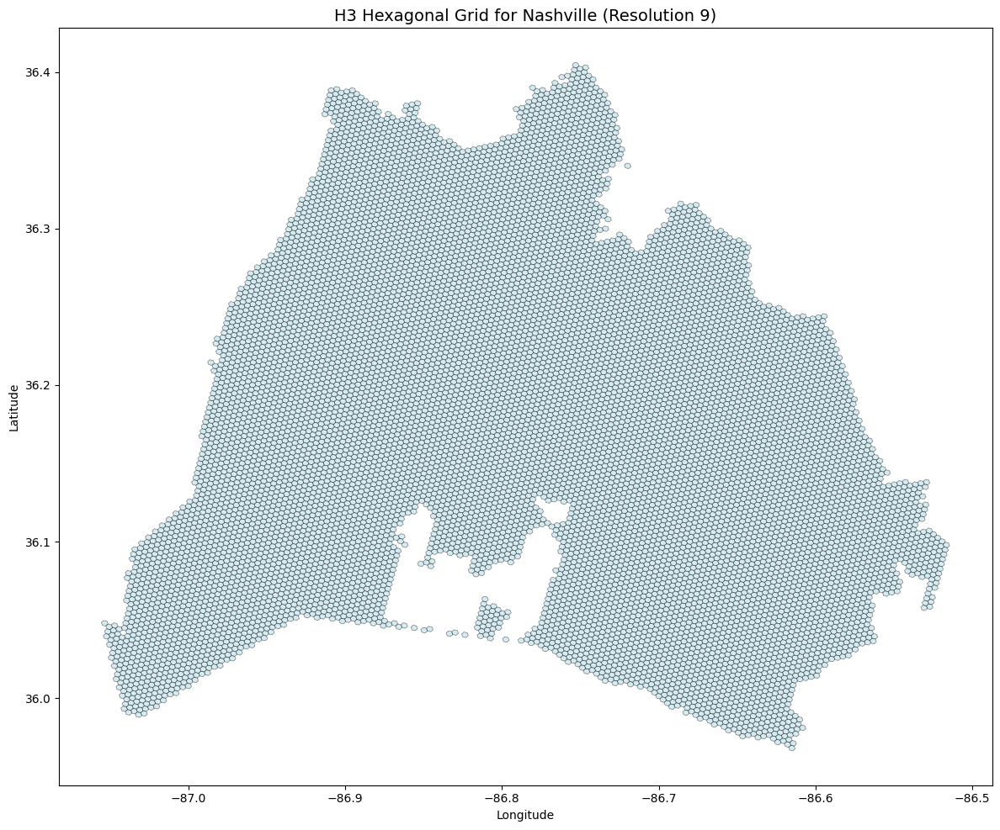

In [19]:
hex_gdf_nashville_9.plot(figsize=(12, 12), facecolor='lightblue', 
                   edgecolor='black', linewidth=0.5, alpha=0.5)
plt.title('H3 Hexagonal Grid for Nashville (Resolution 9)', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.show()

In [20]:
# Save it to avoid recomputation
# H3 uses EPSG:4326 (WGS84) internally, we convert to EPSG:4269 (NAD83) to make it compatible with the demand data.
# The difference between them is negligible (< 1m) in the continental US. 
hex_gdf_nashville.set_crs(epsg=4326, inplace=True)
hex_gdf_nashville = hex_gdf_nashville.to_crs(epsg=4269)
hex_gdf_nashville.to_file('data/hex_nashville_res7.geojson', driver='GeoJSON')

hex_gdf_nashville_8.set_crs(epsg=4326, inplace=True)
hex_gdf_nashville_8 = hex_gdf_nashville_8.to_crs(epsg=4269)
hex_gdf_nashville_8.to_file('data/hex_nashville_res8.geojson', driver='GeoJSON')

hex_gdf_nashville_9.set_crs(epsg=4326, inplace=True)
hex_gdf_nashville_9 = hex_gdf_nashville_9.to_crs(epsg=4269)
hex_gdf_nashville_9.to_file('data/hex_nashville_res9.geojson', driver='GeoJSON')